In [2]:
import pandas as pd

df = pd.read_pickle("./data/post-processed-metrics-dataframe.pkl")

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# Adding a workflow name attribute for legend purposes

In [3]:
workflow_regex = r'^([^-]+)'
df["workflow"] = df["dag"].str.extract(workflow_regex)

In [4]:
df.head()

,dag,system,scheduler,completed,makespan,exec_time,run_stats.scheduling_time,run_stats.total_task_time,run_stats.total_network_traffic,run_stats.total_network_time,...,dag_path,system_path,dag_nodes,dag_edges,dag_density,speedup,efficiency_processors,efficiency_cores,SLR,workflow
0,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-10,"DynamicList[task=CompSize,resource=Speed,cores...",True,104.405775,0.018969,0.011636,4870.725405,111558.89785,892.481093,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,36.735555,2.295972,0.286997,1.582710,1000genome
1,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-100,"DynamicList[task=CompSize,resource=Speed,cores...",True,104.406135,0.018360,0.012827,4870.725405,111558.89785,892.570283,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,36.735429,2.295964,0.286996,1.582716,1000genome
2,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-1000,"DynamicList[task=CompSize,resource=Speed,cores...",True,104.409735,0.022293,0.015228,4870.725405,111558.89785,893.462183,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,36.734162,2.295885,0.286986,1.582770,1000genome
3,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-1250-10,"DynamicList[task=CompSize,resource=Speed,cores...",True,97.092569,0.018212,0.012316,4870.725405,111558.89785,89.257028,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,39.502551,2.468909,0.308614,1.471848,1000genome
4,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-1250-100,"DynamicList[task=CompSize,resource=Speed,cores...",True,97.092929,0.020169,0.012595,4870.725405,111558.89785,89.346218,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,39.502404,2.468900,0.308613,1.471853,1000genome


# Adding node with edge count

In [5]:
df["node+edges"] = df["dag_nodes"] + df["dag_edges"]

In [6]:
df

,dag,system,scheduler,completed,makespan,exec_time,run_stats.scheduling_time,run_stats.total_task_time,run_stats.total_network_traffic,run_stats.total_network_time,...,system_path,dag_nodes,dag_edges,dag_density,speedup,efficiency_processors,efficiency_cores,SLR,workflow,node+edges
0,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-10,"DynamicList[task=CompSize,resource=Speed,cores...",True,104.405775,0.018969,0.011636,4870.725405,111558.897850,892.481093,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,36.735555,2.295972,0.286997,1.582710,1000genome,640
1,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-100,"DynamicList[task=CompSize,resource=Speed,cores...",True,104.406135,0.018360,0.012827,4870.725405,111558.897850,892.570283,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,36.735429,2.295964,0.286996,1.582716,1000genome,640
2,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-1000,"DynamicList[task=CompSize,resource=Speed,cores...",True,104.409735,0.022293,0.015228,4870.725405,111558.897850,893.462183,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,36.734162,2.295885,0.286986,1.582770,1000genome,640
3,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-1250-10,"DynamicList[task=CompSize,resource=Speed,cores...",True,97.092569,0.018212,0.012316,4870.725405,111558.897850,89.257028,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,39.502551,2.468909,0.308614,1.471848,1000genome,640
4,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-1250-100,"DynamicList[task=CompSize,resource=Speed,cores...",True,97.092929,0.020169,0.012595,4870.725405,111558.897850,89.346218,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,39.502404,2.468900,0.308613,1.471853,1000genome,640
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527467,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-1250-100,"DYTAS[navigation=Front,sorting=DFS,multicore=S...",True,5612.012352,0.002131,0.000258,37701.250710,72918.129089,147.190401,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,6.717956,0.839744,0.839744,3.044186,srasearch,256
527468,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-1250-1000,"DYTAS[navigation=Front,sorting=DFS,multicore=S...",True,5612.019552,0.002046,0.000228,37701.250710,72918.129089,147.512601,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,6.717947,0.839743,0.839743,3.044189,srasearch,256
527469,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-12500-10,"DYTAS[navigation=Front,sorting=DFS,multicore=S...",True,5606.004155,0.003421,0.001544,37701.250710,74002.393485,11.938948,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,6.725156,0.840644,0.840644,3.040926,srasearch,256
527470,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-12500-100,"DYTAS[navigation=Front,sorting=DFS,multicore=S...",True,5606.004965,0.001334,0.000142,37701.250710,74002.393485,11.974498,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,6.725155,0.840644,0.840644,3.040927,srasearch,256


# Grabbing only DYTAS results

In [7]:
df_dytas = df[df["scheduler"].str.contains('DYTAS', na=False)]

In [8]:
df_dytas

,dag,system,scheduler,completed,makespan,exec_time,run_stats.scheduling_time,run_stats.total_task_time,run_stats.total_network_traffic,run_stats.total_network_time,...,system_path,dag_nodes,dag_edges,dag_density,speedup,efficiency_processors,efficiency_cores,SLR,workflow,node+edges
143856,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-10,"DYTAS[navigation=All,sorting=Khan,multicore=Us...",True,184.180332,0.010744,0.002251,6132.568605,111534.230591,892.283545,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,20.824179,1.301511,0.162689,2.792031,1000genome,640
143857,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-100,"DYTAS[navigation=All,sorting=Khan,multicore=Us...",True,184.180692,0.008345,0.002204,6132.568605,111534.230591,892.370845,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,20.824138,1.301509,0.162689,2.792036,1000genome,640
143858,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-1000,"DYTAS[navigation=All,sorting=Khan,multicore=Us...",True,184.184292,0.009254,0.002349,6132.568605,111534.230591,893.243845,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,20.823731,1.301483,0.162685,2.792091,1000genome,640
143859,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-1250-10,"DYTAS[navigation=All,sorting=Khan,multicore=Us...",True,176.368798,0.007351,0.001760,6127.952343,111527.540951,89.231603,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,21.746501,1.359156,0.169895,2.673614,1000genome,640
143860,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-1250-100,"DYTAS[navigation=All,sorting=Khan,multicore=Us...",True,176.369158,0.009465,0.002293,6127.952343,111527.540951,89.317733,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,21.746456,1.359154,0.169894,2.673619,1000genome,640
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527467,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-1250-100,"DYTAS[navigation=Front,sorting=DFS,multicore=S...",True,5612.012352,0.002131,0.000258,37701.250710,72918.129089,147.190401,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,6.717956,0.839744,0.839744,3.044186,srasearch,256
527468,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-1250-1000,"DYTAS[navigation=Front,sorting=DFS,multicore=S...",True,5612.019552,0.002046,0.000228,37701.250710,72918.129089,147.512601,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,6.717947,0.839743,0.839743,3.044189,srasearch,256
527469,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-12500-10,"DYTAS[navigation=Front,sorting=DFS,multicore=S...",True,5606.004155,0.003421,0.001544,37701.250710,74002.393485,11.938948,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,6.725156,0.840644,0.840644,3.040926,srasearch,256
527470,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-12500-100,"DYTAS[navigation=Front,sorting=DFS,multicore=S...",True,5606.004965,0.001334,0.000142,37701.250710,74002.393485,11.974498,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,6.725155,0.840644,0.840644,3.040927,srasearch,256


# Grabbing HEFT results

In [9]:
df_heft = df[df["scheduler"].str.contains("HEFT", na=False)]

In [10]:
df_heft

,dag,system,scheduler,completed,makespan,exec_time,run_stats.scheduling_time,run_stats.total_task_time,run_stats.total_network_traffic,run_stats.total_network_time,...,system_path,dag_nodes,dag_edges,dag_density,speedup,efficiency_processors,efficiency_cores,SLR,workflow,node+edges
95904,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-10,HEFT,True,89.528809,0.010879,0.006139,4439.504391,111558.106647,892.474663,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,42.839888,2.677493,0.334687,1.357187,1000genome,640
95905,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-100,HEFT,True,89.529079,0.008100,0.004550,4439.504391,111558.106647,892.562953,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,42.839759,2.677485,0.334686,1.357191,1000genome,640
95906,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-125-1000,HEFT,True,89.531779,0.010862,0.006076,4439.504391,111558.106647,893.445853,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,42.838467,2.677404,0.334676,1.357232,1000genome,640
95907,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-1250-10,HEFT,True,82.224254,0.007957,0.004515,4441.256452,111558.106647,89.256295,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,46.645655,2.915353,0.364419,1.246456,1000genome,640
95908,1000genome-chameleon-10ch-100k-001,cluster-het-16-128-ConstantBandwidth-1250-100,HEFT,True,82.224524,0.008115,0.004766,4441.256452,111558.106647,89.344585,...,/home/hgsm/dytas-comparisons/analysis/../syste...,260,380,0.011286,46.645502,2.915344,0.364418,1.246460,1000genome,640
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143851,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-1250-100,HEFT,True,4717.220406,0.003664,0.001350,37701.250710,68387.007305,134.640868,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,7.992260,0.999032,0.999032,2.558814,srasearch,256
143852,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-1250-1000,HEFT,True,4717.221306,0.004411,0.001248,37701.250710,68387.007305,135.023368,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,7.992258,0.999032,0.999032,2.558814,srasearch,256
143853,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-12500-10,HEFT,True,4717.220309,0.003863,0.001507,37701.250710,68387.007305,13.461408,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,7.992260,0.999032,0.999032,2.558814,srasearch,256
143854,srasearch-chameleon-50a-005,cluster-hom-8-8-SharedBandwidth-12500-100,HEFT,True,4717.220399,0.004778,0.002132,37701.250710,68387.007305,13.499658,...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,7.992260,0.999032,0.999032,2.558814,srasearch,256


# Validating how density grows w.r.t. node count and edge count on the benchmark DAGs.

Below we see that graphs are not getting `denser` as the number of tasks simply increase because for them to become dense, the number of edges $E$ need to grow as the squared of the number of nodes $V^2$. We instead only see a linear growth of $E$ w.r.t. $V$.

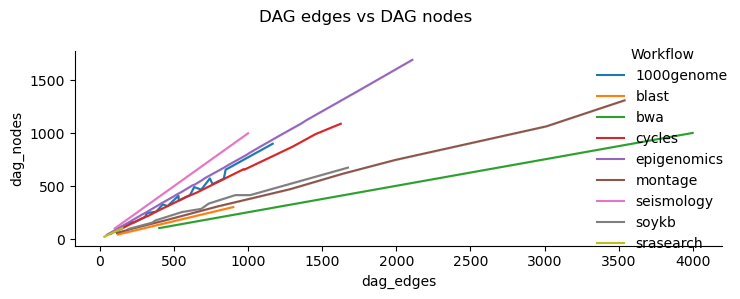

In [16]:
g = sns.relplot(
    data=df,
    x="dag_edges",
    y="dag_nodes", 
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("DAG edges vs DAG nodes")
plt.tight_layout()
plt.show()

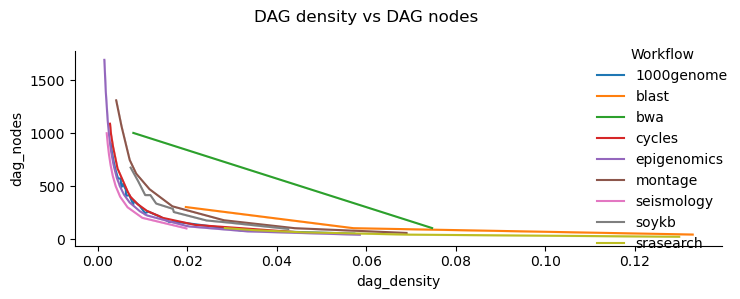

In [17]:
g = sns.relplot(
    data=df,
    x="dag_density",
    y="dag_nodes", 
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("DAG density vs DAG nodes")
plt.tight_layout()
plt.show()

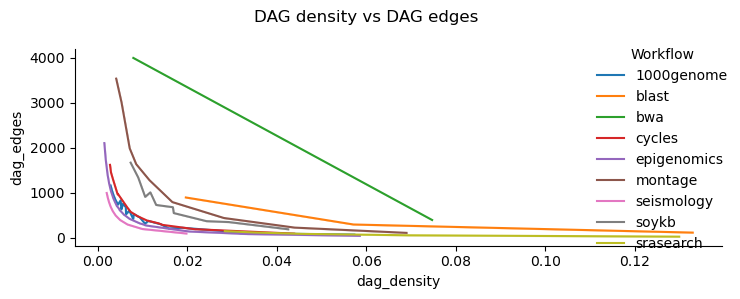

In [39]:
g = sns.relplot(
    data=df,
    x="dag_density",
    y="dag_edges", 
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("DAG density vs DAG edges")
plt.tight_layout()
plt.show()

# Plotting execution times vs worklfow nodes
Debating whether to use `run_stats.scheduling_time` or `exec_time`

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

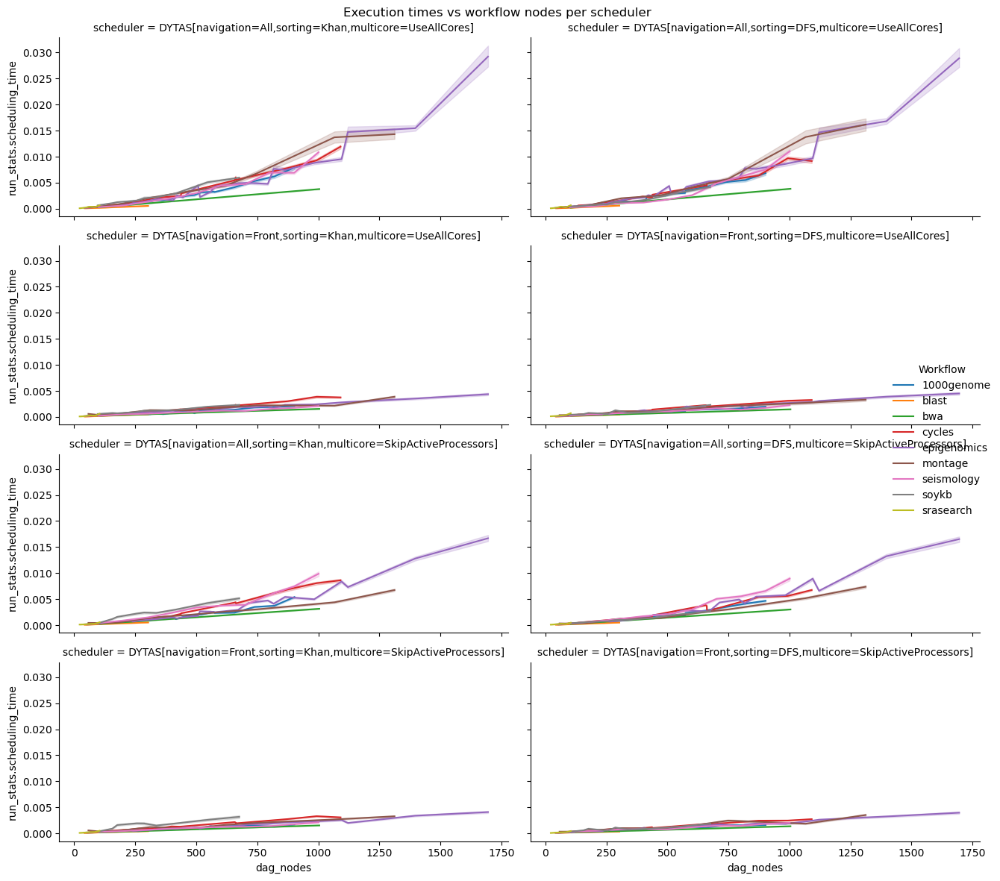

In [7]:
g = sns.relplot(
    data=df_dytas,
    x="dag_nodes",
    y="run_stats.scheduling_time", 
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Execution times vs workflow nodes per scheduler")
plt.tight_layout()
plt.show()

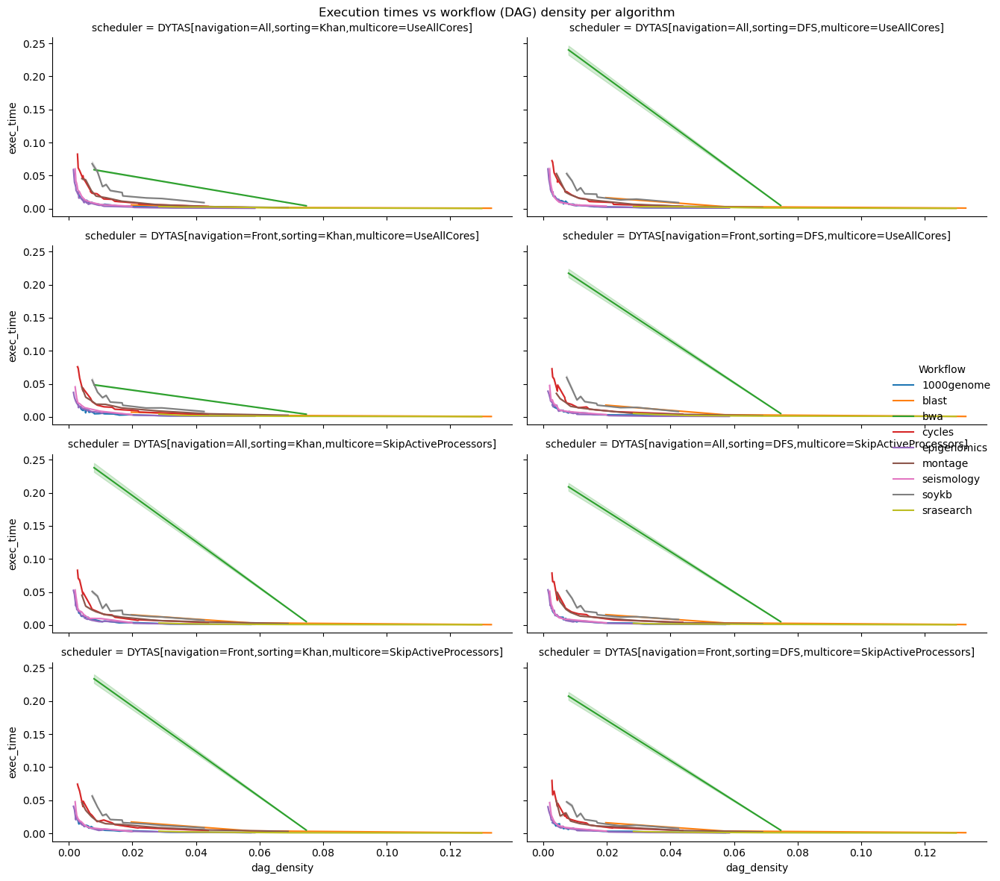

In [8]:
g = sns.relplot(
    data=df_dytas,
    x="dag_density",
    y="exec_time",
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Execution times vs workflow (DAG) density per algorithm")
plt.tight_layout()
plt.show()

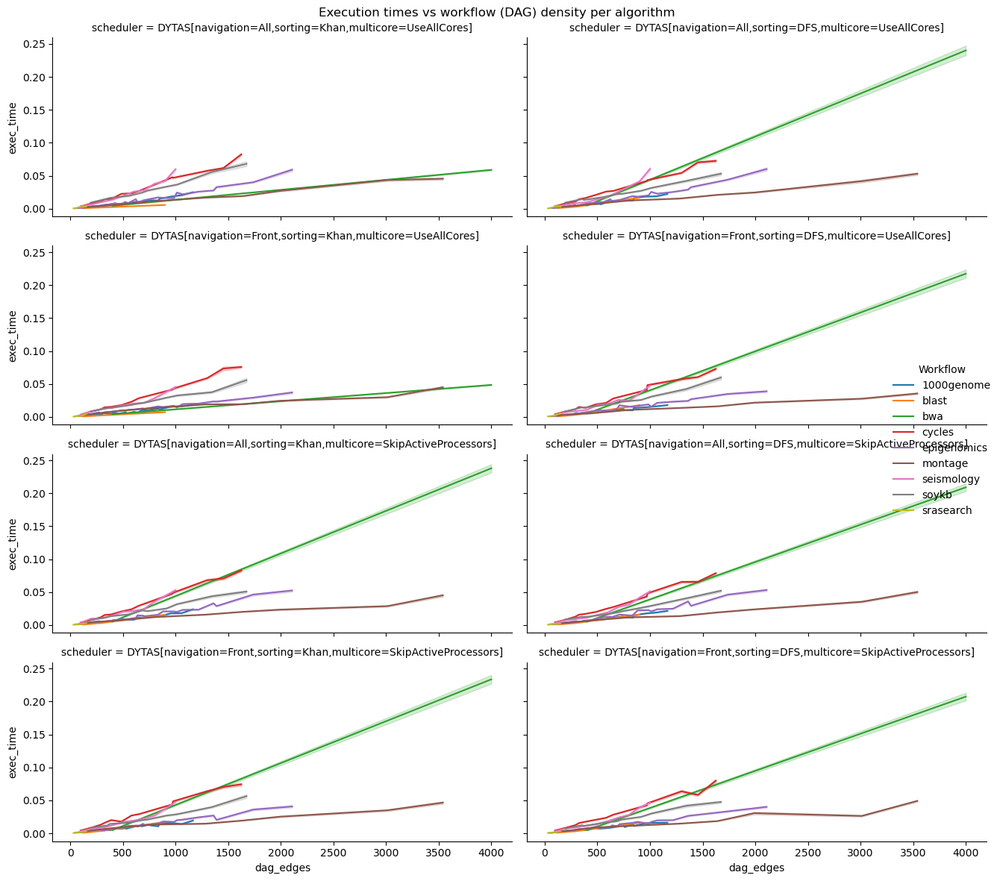

In [24]:
g = sns.relplot(
    data=df_dytas,
    x="dag_edges",
    y="exec_time",
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Execution times vs workflow (DAG) density per algorithm")
plt.tight_layout()
plt.show()

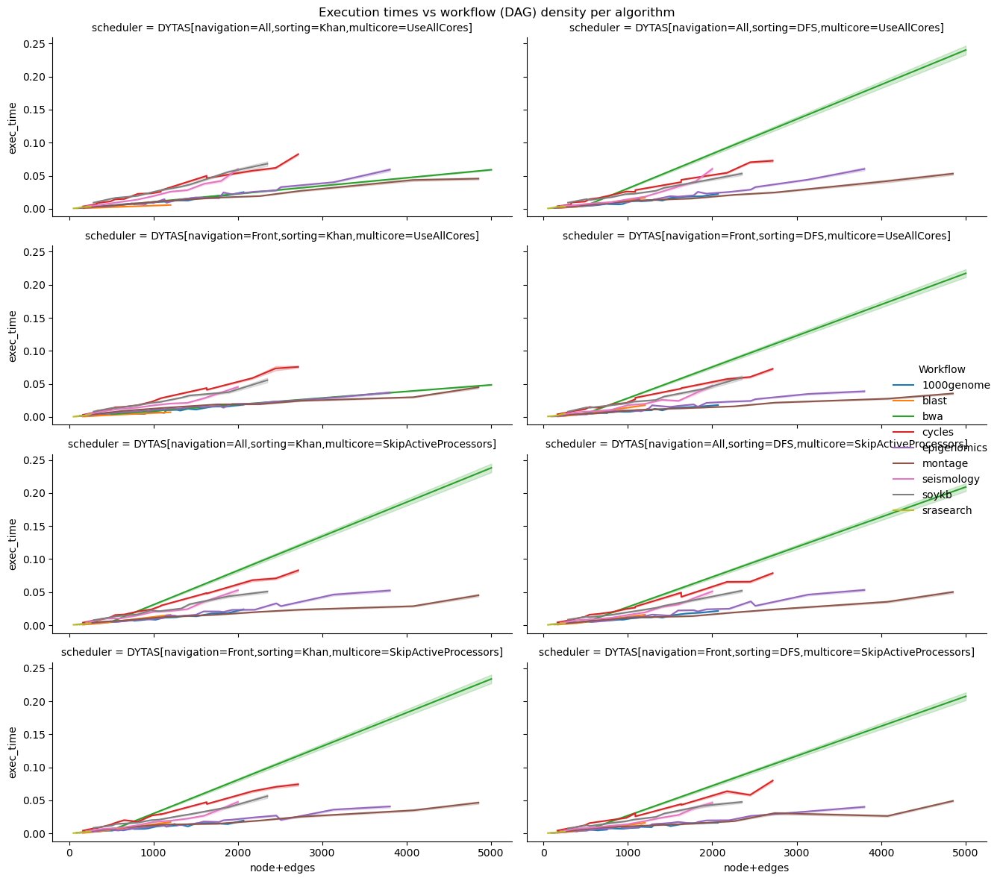

In [31]:
g = sns.relplot(
    data=df_dytas,
    x="node+edges",
    y="exec_time",
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Execution times vs workflow (DAG) density per algorithm")
plt.tight_layout()
plt.show()

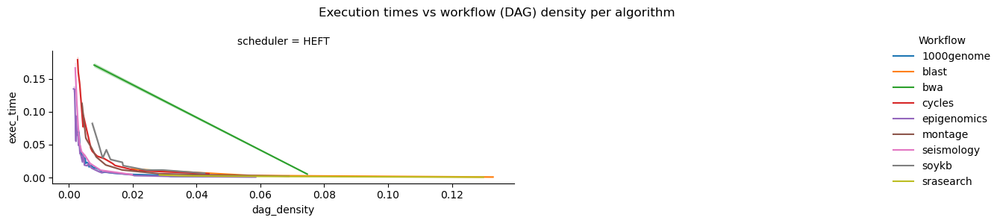

In [22]:
g = sns.relplot(
    data=df_heft,
    x="dag_density",
    y="exec_time",
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Execution times vs workflow (DAG) density per algorithm")
plt.tight_layout()
plt.show()

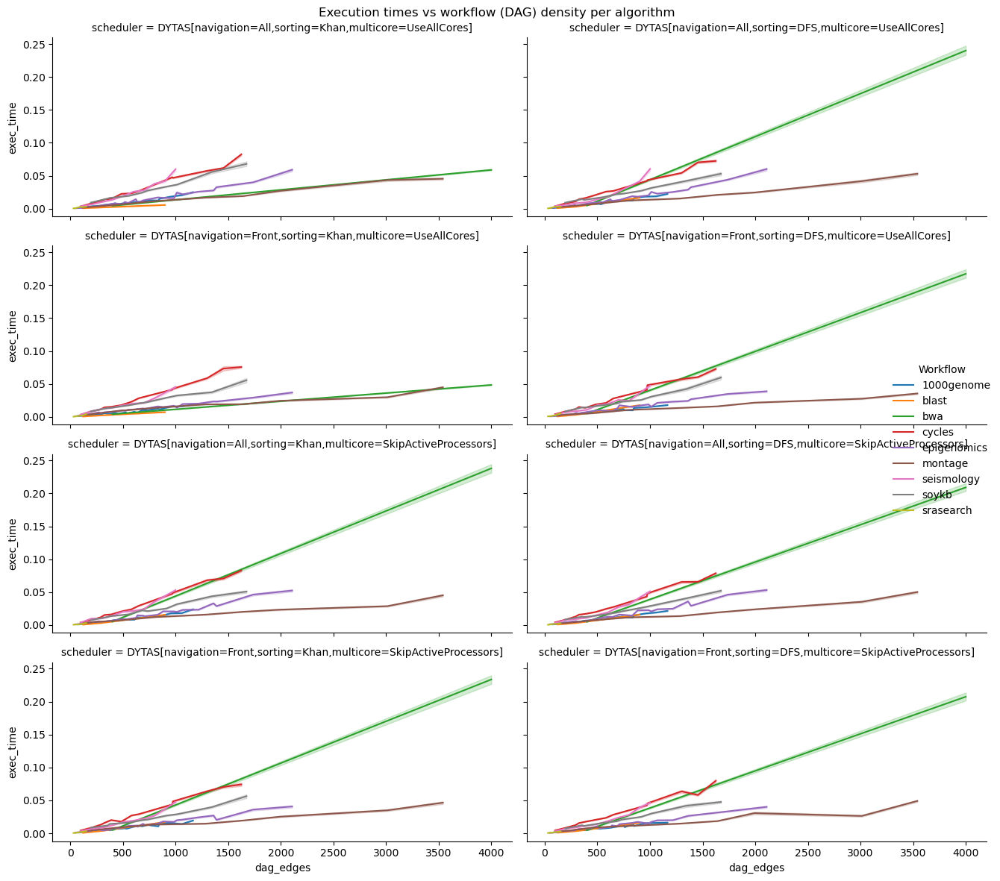

In [23]:
g = sns.relplot(
    data=df_dytas,
    x="dag_edges",
    y="exec_time",
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Execution times vs workflow (DAG) density per algorithm")
plt.tight_layout()
plt.show()

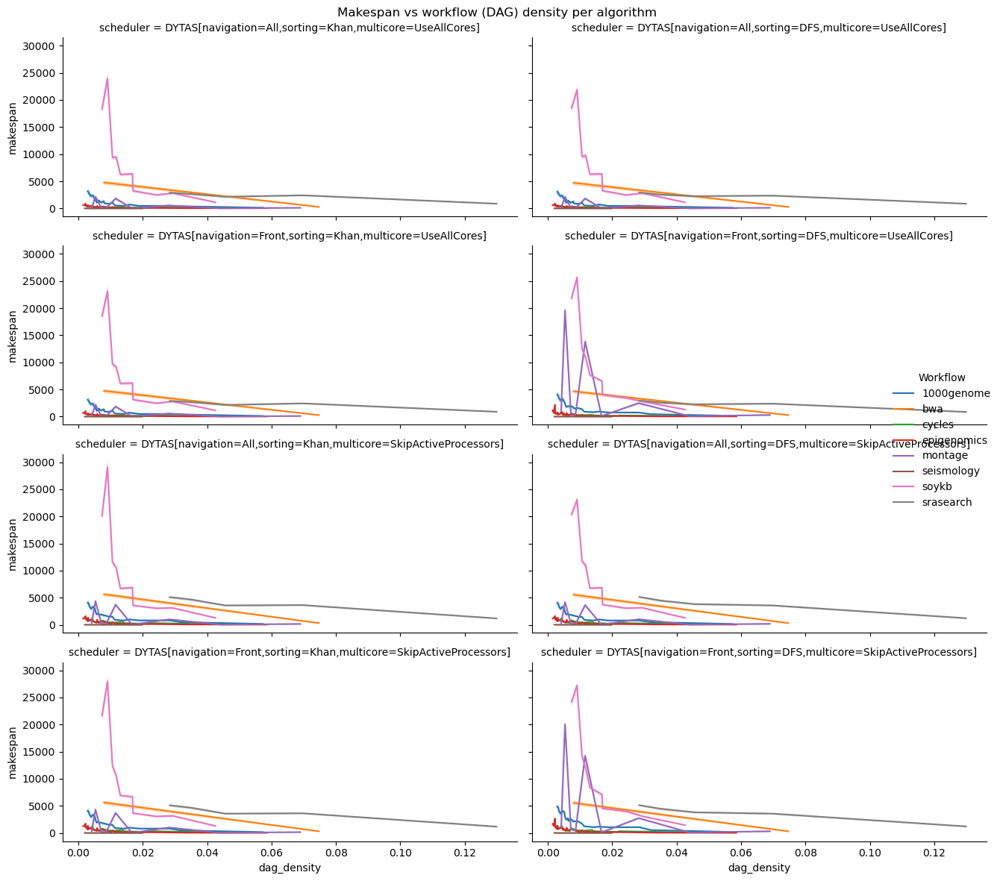

In [9]:
g = sns.relplot(
    data=df_dytas[df_dytas["workflow"] != "blast"],
    x="dag_density",
    y="makespan",
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Makespan vs workflow (DAG) density per algorithm")
plt.tight_layout()
plt.show()

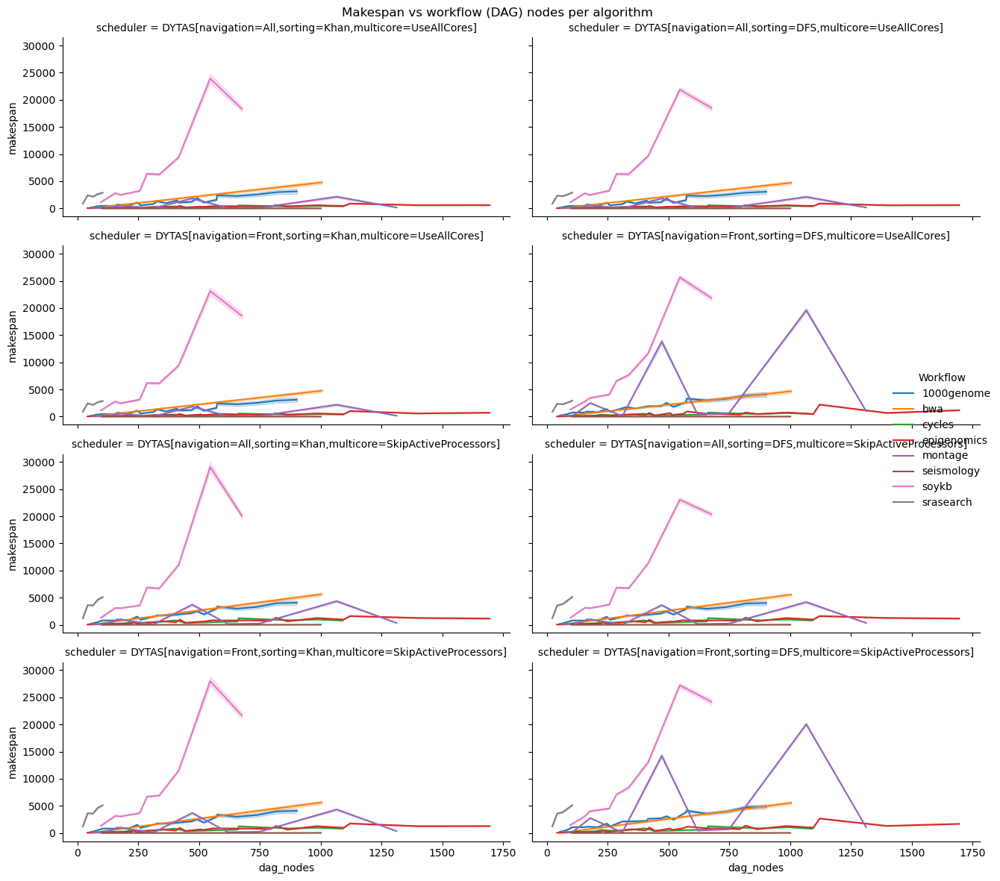

In [10]:
g = sns.relplot(
    data=df_dytas[df_dytas["workflow"] != "blast"],
    x="dag_nodes",
    y="makespan",
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Makespan vs workflow (DAG) nodes per algorithm")
plt.tight_layout()
plt.show()

There's a pattern here that suggests that a denser DAG does not automatically lead to longer execution times nor longer makespans. The number of tasks in the DAG are what more clearly define how long the algorithm is going to take to execute alongside the makespan of the schedule.

# Doing Big O Analysis
#### By verifying which curve fits the exec time vs dag nodes

In [11]:
import json
import numpy as np
import pandas as pd
import re
import argparse
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define complexity functions
def t_linear_fit(t, c):
    return c * t

def t_log_t_fit(t, c):
    return c * t * np.log(t)

def t_squared_fit(t, c):
    return c * np.power(t, 2)

def t_cubed_fit(t, c):
    return c * np.power(t, 3)

def t_fourth_power_fit(t, c):
    return c * np.power(t, 4)

def t_exponential_fit(t, c):
    return c * np.power(2, t)

# Function to fit and compare models
def fit_and_plot_complexity(df, workflow_name):
    graph_sizes = df[df["workflow"] == workflow_name]["dag_nodes"]
    exec_times = df[df["workflow"] == workflow_name]["run_stats.scheduling_time"]

    # Ensure enough data points for fitting
    if len(graph_sizes) < 3:
        print(f"Skipping {workflow_name}: Insufficient data for fitting.")
        return None

    # Dictionary to store fit results
    fit_results = {}

    # Complexity functions to test
    functions = {
        "T": t_linear_fit,
        "T log T": t_log_t_fit,
        "T^2": t_squared_fit,
        "T^3": t_cubed_fit,
        "T^4": t_fourth_power_fit,
        "2^T": t_exponential_fit
    }

    # Fit models and calculate MSE
    for label, func in functions.items():
        try:
            params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)
            estimated_c = params[0]
            predictions = func(graph_sizes, estimated_c)
            mse = np.mean((exec_times - predictions) ** 2)
            fit_results[label] = {
                "c": estimated_c,
                "mse": mse,
                "predictions": predictions,
                "equation": f"O({label}) (c={estimated_c:.6f})"
            }
        except RuntimeError:
            fit_results[label] = {
                "c": None,
                "mse": np.inf,
                "predictions": np.full_like(graph_sizes, np.nan),
                "equation": "Fit Failed"
            }

    # Determine the best fit based on MSE
    best_fit = min(fit_results, key=lambda x: fit_results[x]["mse"])

    # 📊 PLOT THE RESULTS
    plt.figure(figsize=(10, 6))
    plt.scatter(graph_sizes, exec_times, label="Actual Data", color="black", marker="o")

    colors = ["blue", "red", "green", "purple", "orange", "brown"]
    for (label, result), color in zip(fit_results.items(), colors):
        plt.plot(graph_sizes, result["predictions"], label=result["equation"], linestyle="--", color=color)

    plt.xlabel("Graph Size (Number of Nodes)")
    plt.ylabel("Execution Time (seconds)")
    plt.title(f"Complexity Fit for {workflow_name} Workflow")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Return results
    return {
        "workflow": workflow_name,
        "best_fit": best_fit,
        **{label: result["equation"] for label, result in fit_results.items()}
    }

# Selecting the worst case scenario results from algorithm -> workflow -> node-count pair

In [12]:
max_idx = df_dytas.groupby(
    ["scheduler", "workflow", "dag_nodes"]
)["exec_time"].idxmax()

In [13]:
max_df_dytas = df_dytas.loc[max_idx].reset_index(drop=True)

In [14]:
max_df_dytas

,dag,system,scheduler,completed,makespan,exec_time,run_stats.scheduling_time,run_stats.total_task_time,run_stats.total_network_traffic,run_stats.total_network_time,...,dag_path,system_path,dag_nodes,dag_edges,dag_density,speedup,efficiency_processors,efficiency_cores,SLR,workflow
0,1000genome-chameleon-2ch-100k-001,cluster-hom-16-256-ConstantBandwidth-12500-100,"DYTAS[navigation=All,sorting=DFS,multicore=Ski...",True,78.905859,0.002138,0.000181,831.388500,20855.496712,1.688140,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,52,76,0.057315,10.536461,0.658529,0.041158,1.284990,1000genome
1,1000genome-chameleon-2ch-250k-001,cluster-het-16-256-SharedBandwidth-12500-10,"DYTAS[navigation=All,sorting=DFS,multicore=Ski...",True,193.673351,0.002897,0.000298,2011.654048,127567.920374,173.371108,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,82,106,0.031918,6.551219,0.409451,0.025591,1.988501,1000genome
2,1000genome-chameleon-4ch-100k-001,cluster-het-16-128-SharedBandwidth-125-10,"DYTAS[navigation=All,sorting=DFS,multicore=Ski...",True,674.283256,0.005273,0.000522,5454.462467,42090.119095,6920.769894,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,104,152,0.028379,5.067585,0.316724,0.039591,5.072326,1000genome
3,1000genome-chameleon-6ch-100k-001,cluster-het-16-256-SharedBandwidth-125-100,"DYTAS[navigation=All,sorting=DFS,multicore=Ski...",True,809.238826,0.006223,0.000548,5166.982442,65710.043979,15523.863844,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,156,228,0.018859,4.233209,0.264576,0.016536,9.289325,1000genome
4,1000genome-chameleon-4ch-250k-001,cluster-het-16-256-ConstantBandwidth-125-100,"DYTAS[navigation=All,sorting=DFS,multicore=Ski...",True,325.255599,0.009145,0.000933,4426.919390,255502.240654,2044.074425,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,164,212,0.015861,9.432029,0.589502,0.036844,3.456171,1000genome
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
811,srasearch-chameleon-10a-001,cluster-hom-8-8-ConstantBandwidth-125-100,"DYTAS[navigation=Front,sorting=Khan,multicore=...",True,471.621286,0.003638,0.001254,2228.474112,6887.538508,55.106708,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,22,30,0.129870,4.725135,0.590642,0.590642,1.472134,srasearch
812,srasearch-chameleon-20a-004,cluster-hom-16-128-SharedBandwidth-12500-1000,"DYTAS[navigation=Front,sorting=Khan,multicore=...",True,1531.067041,0.002571,0.000356,16807.420080,15537.088498,2.667368,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,42,60,0.069686,10.977586,0.686099,0.085762,1.000172,srasearch
813,srasearch-chameleon-30a-005,cluster-hom-16-128-ConstantBandwidth-1250-100,"DYTAS[navigation=Front,sorting=Khan,multicore=...",True,1967.078280,0.004306,0.000436,29534.610223,27205.612783,21.787490,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,64,92,0.045635,15.014456,0.938403,0.117300,1.000609,srasearch
814,srasearch-chameleon-40a-002,cluster-het-8-8-SharedBandwidth-125-10,"DYTAS[navigation=Front,sorting=Khan,multicore=...",True,1622.511000,0.005795,0.000263,10919.455030,43902.813274,5582.054099,...,/home/hgsm/dytas-comparisons/analysis/../dags/...,/home/hgsm/dytas-comparisons/analysis/../syste...,84,122,0.034997,4.482160,0.560270,0.560270,3.006950,srasearch


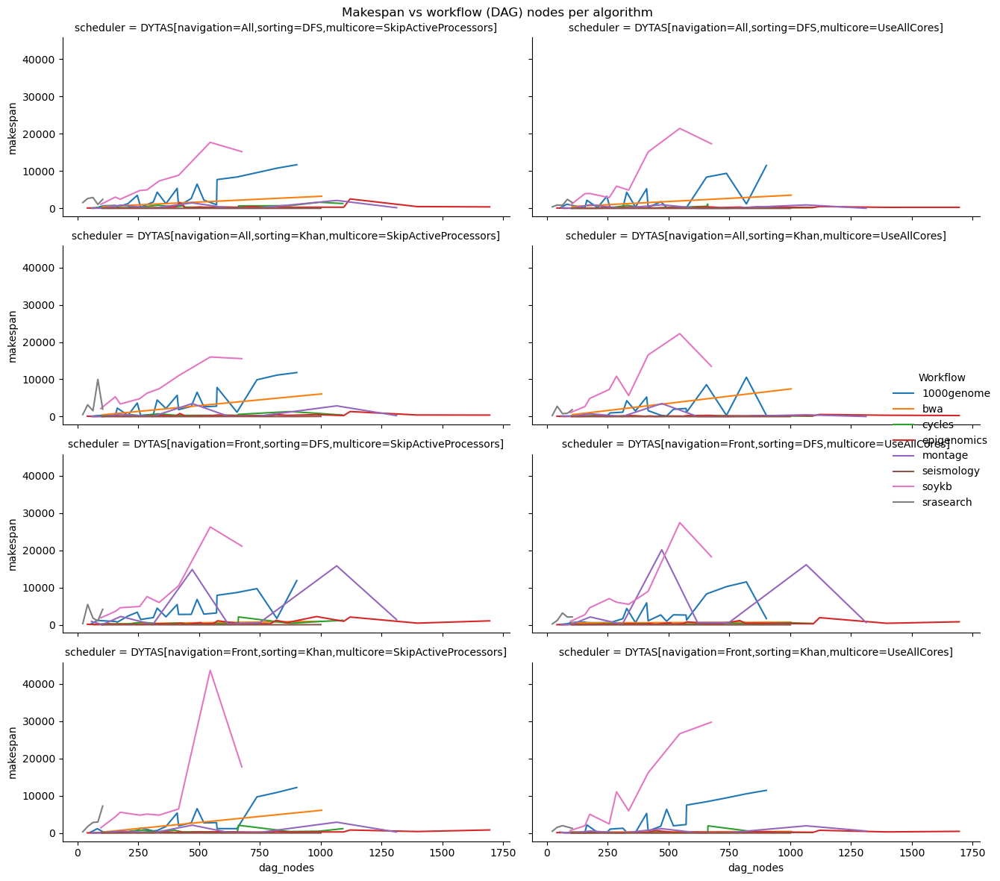

In [15]:
g = sns.relplot(
    data=max_df_dytas[max_df_dytas["workflow"] != "blast"],
    x="dag_nodes",
    y="makespan",
    hue="workflow",          # common hue parameter across all plots
    kind="line",
    col="scheduler",        # each unique value in 'group' creates a separate subplot
    col_wrap=2,         # arrange the subplots in a grid (e.g., 4 per row)
    height=3,           # adjust the size of each subplot
    aspect=2,         # adjust aspect ratio of subplots
    facet_kws={'sharey': True}  # share y-axis if desired
)

g._legend.set_title("Workflow")
g.fig.suptitle("Makespan vs workflow (DAG) nodes per algorithm")
plt.tight_layout()
plt.show()

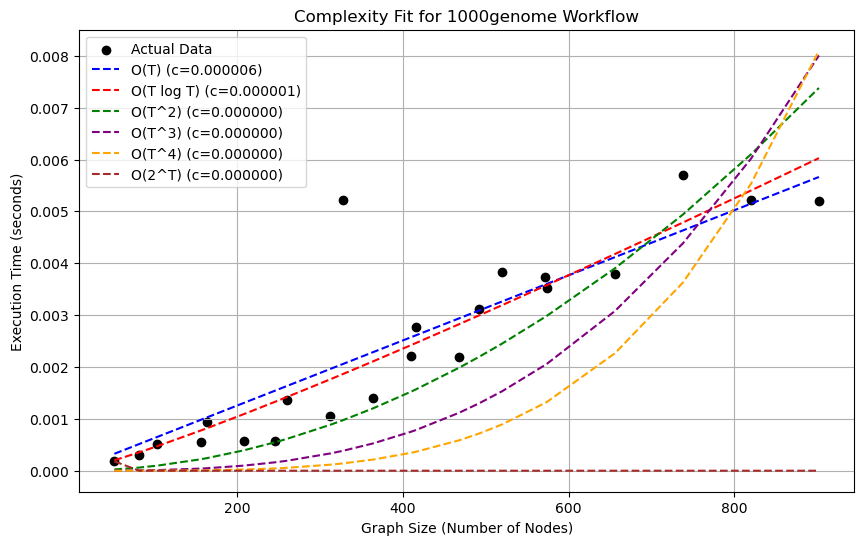

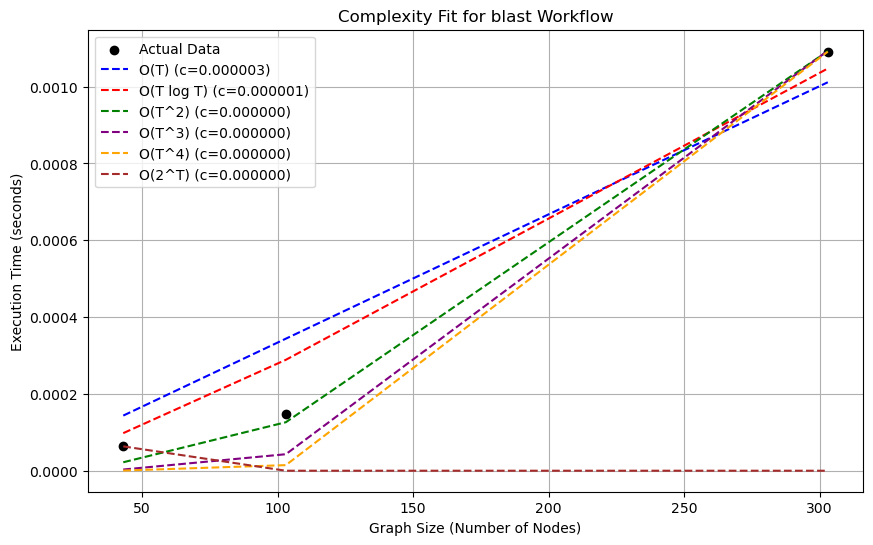

Skipping bwa: Insufficient data for fitting.


/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


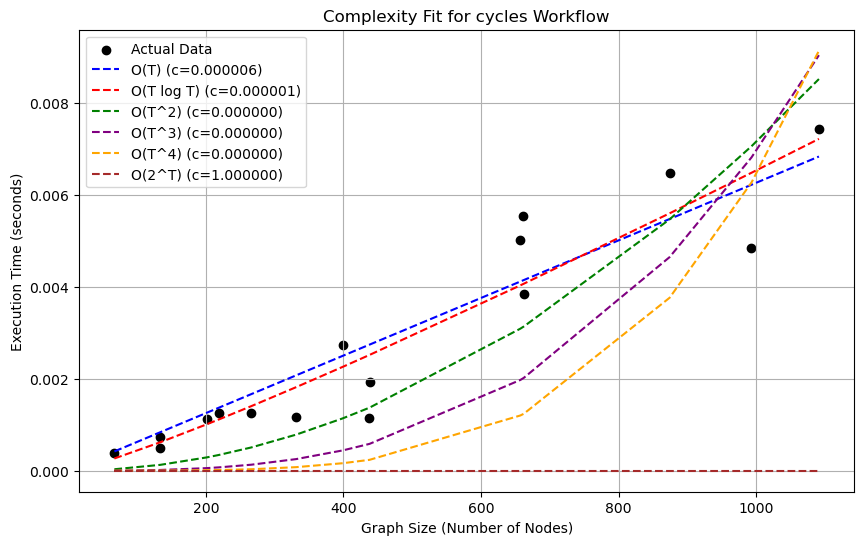

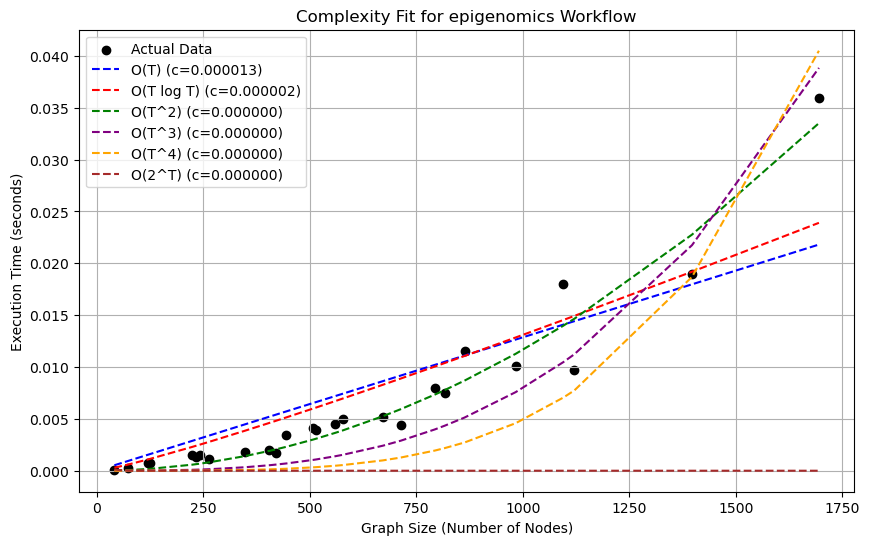

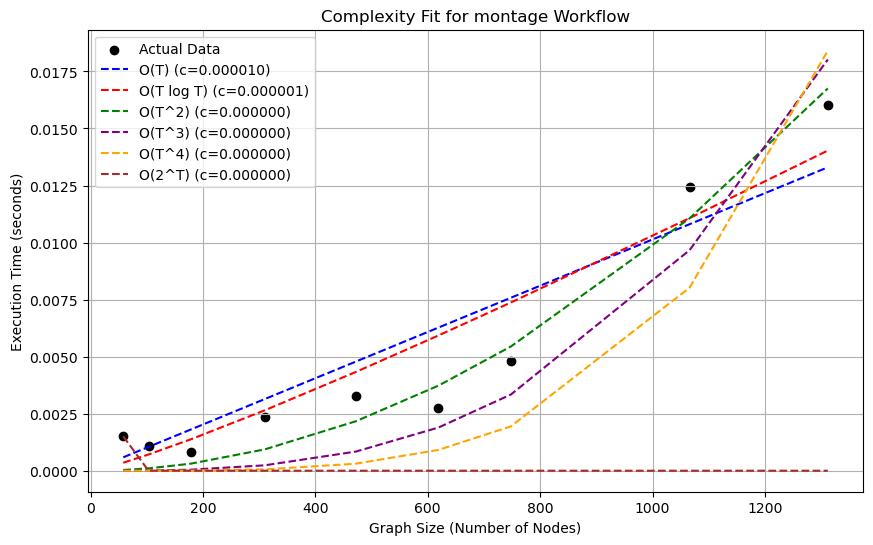

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


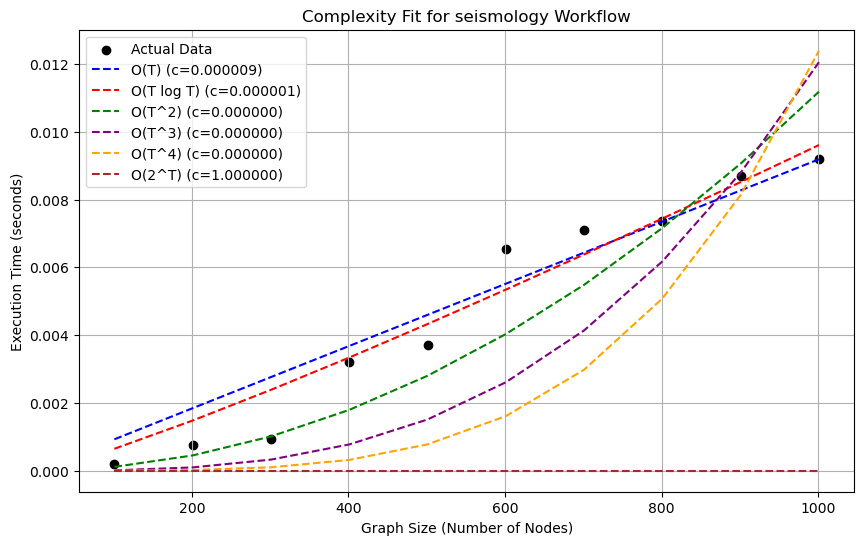

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


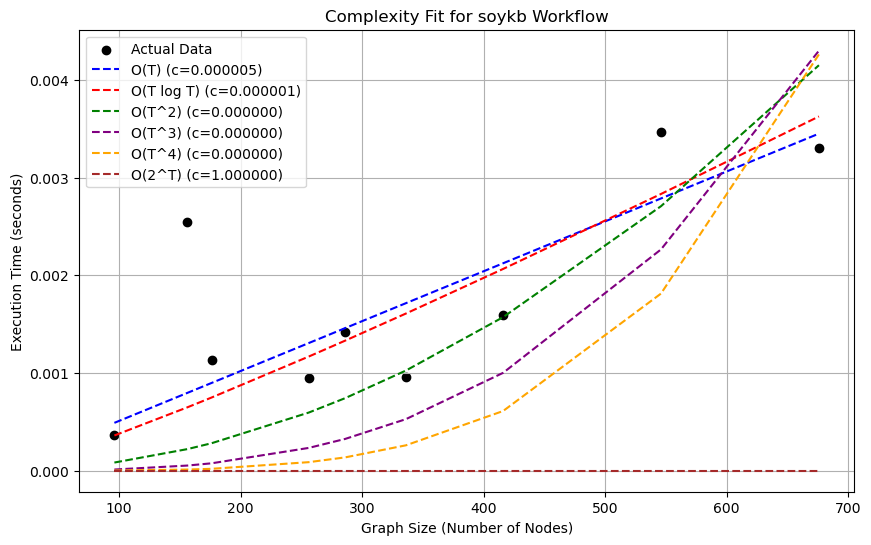

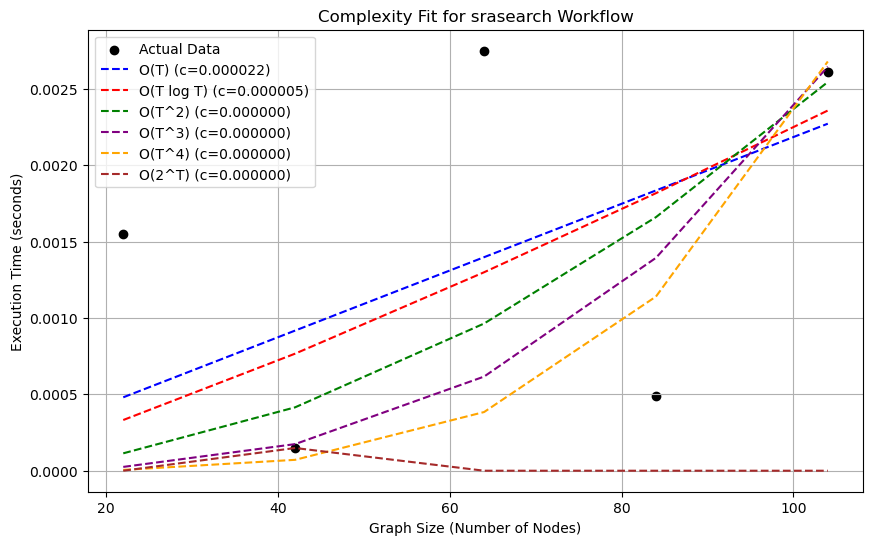

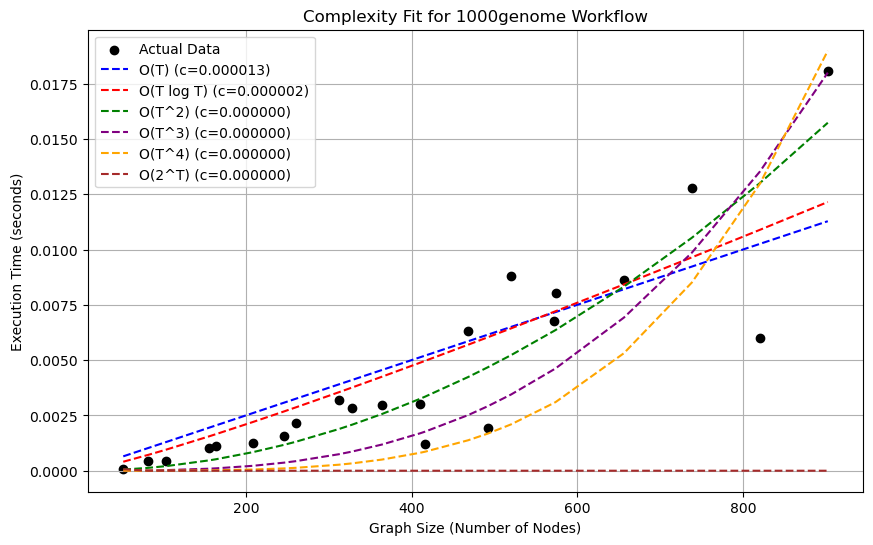

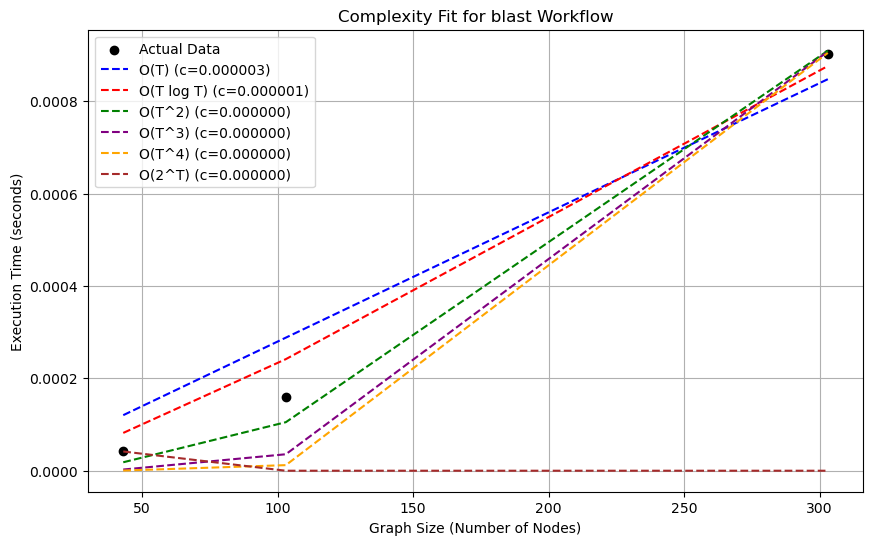

Skipping bwa: Insufficient data for fitting.


/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


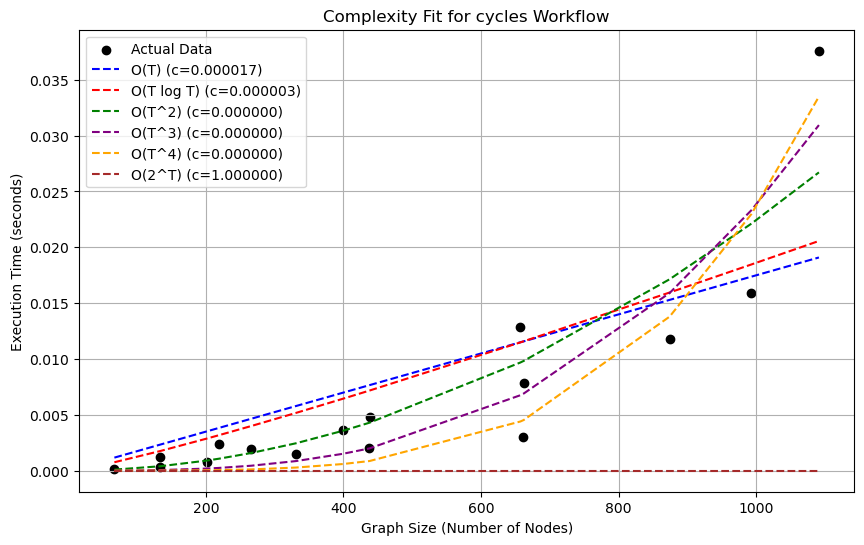

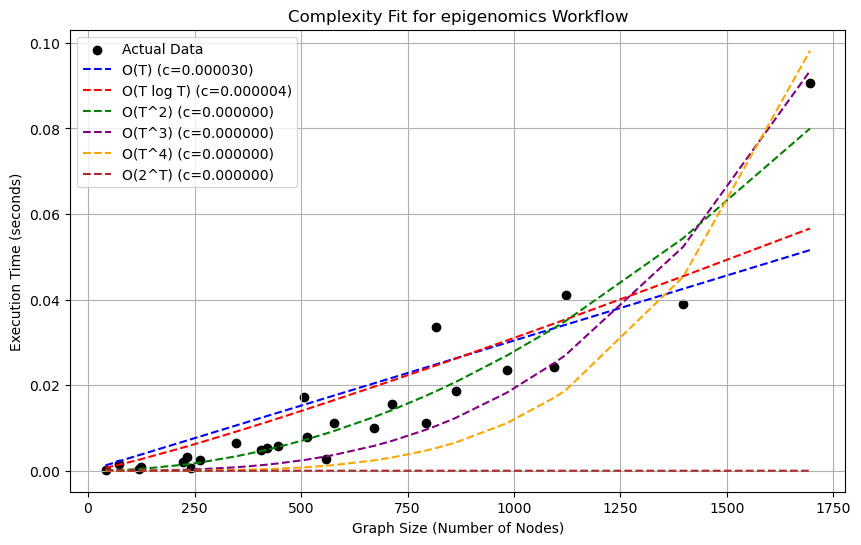

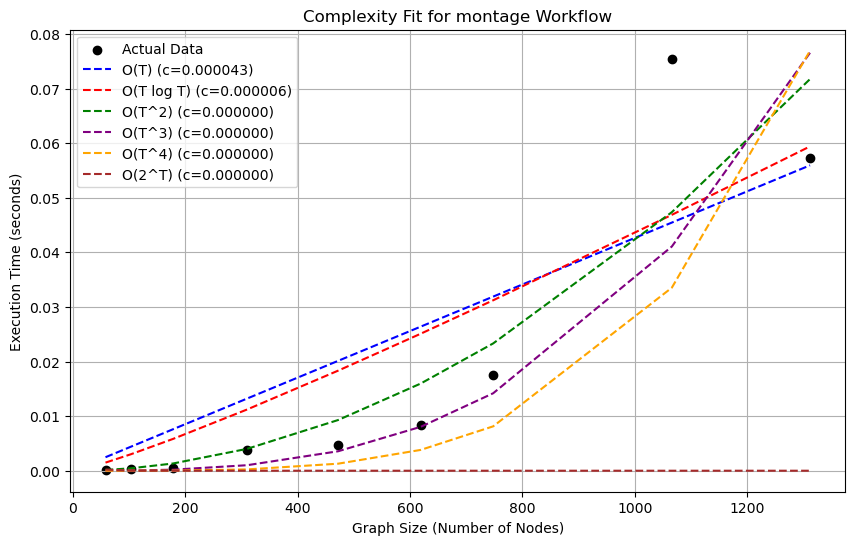

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


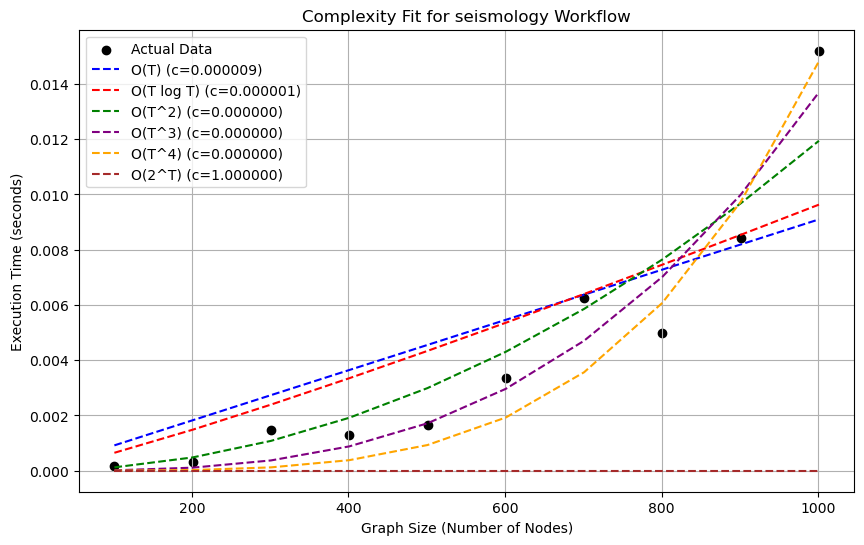

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


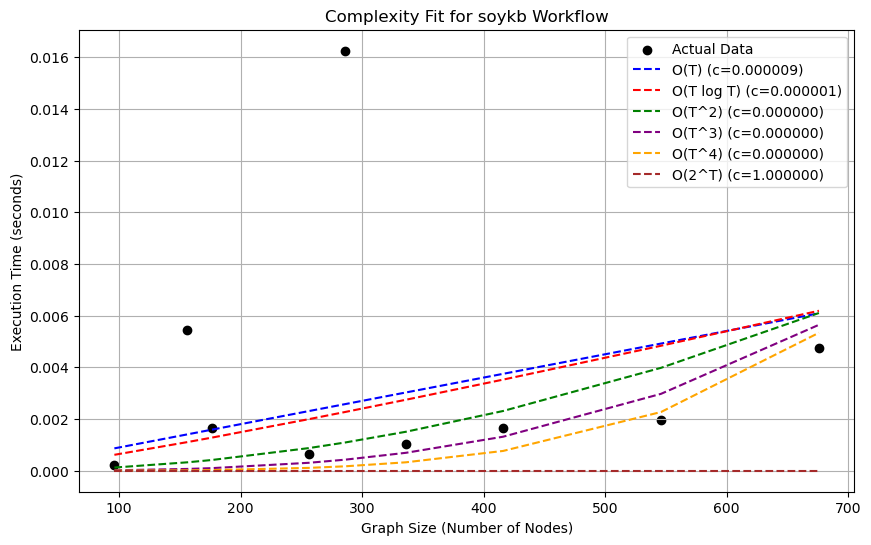

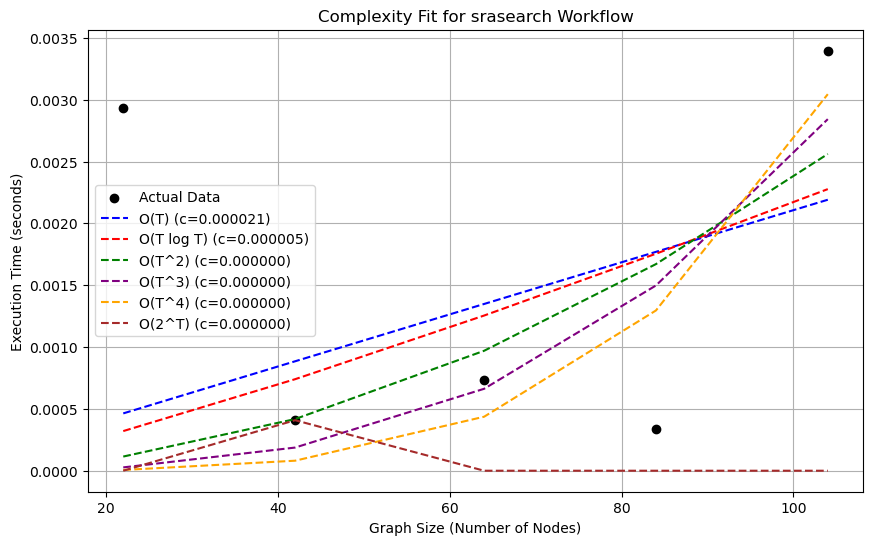

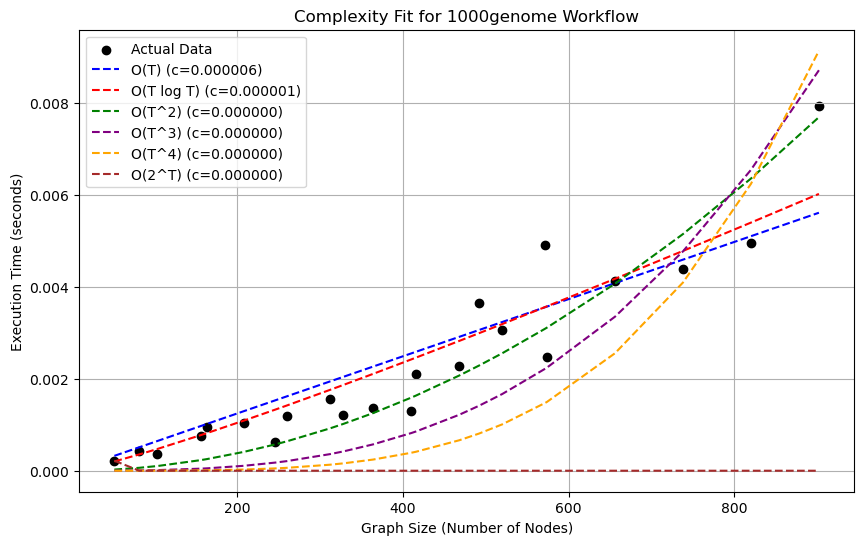

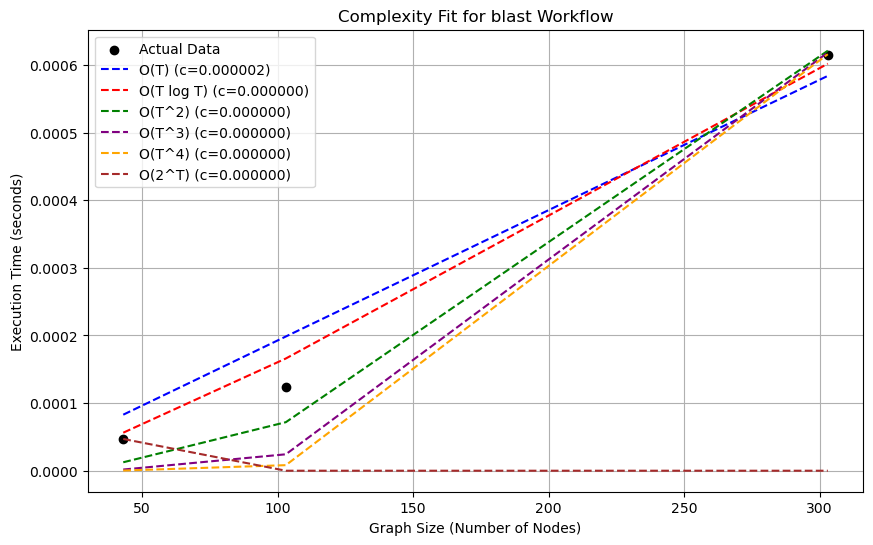

Skipping bwa: Insufficient data for fitting.


/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


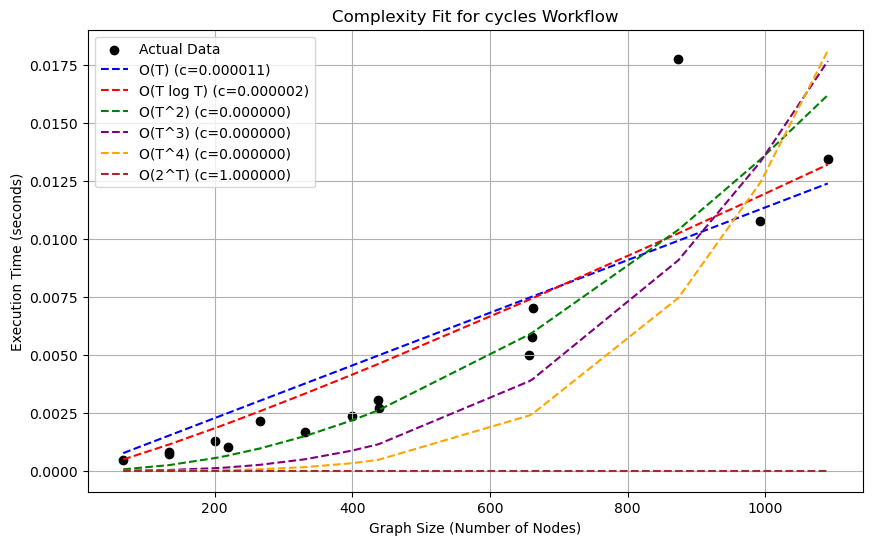

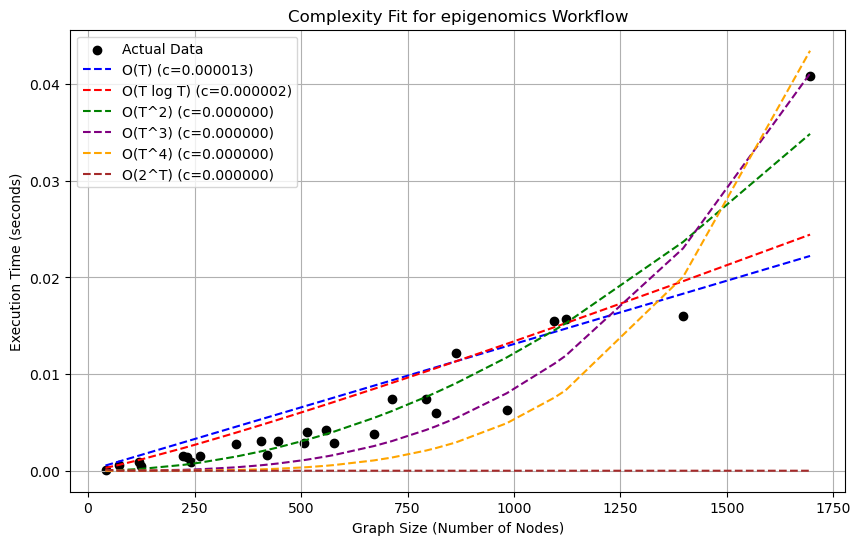

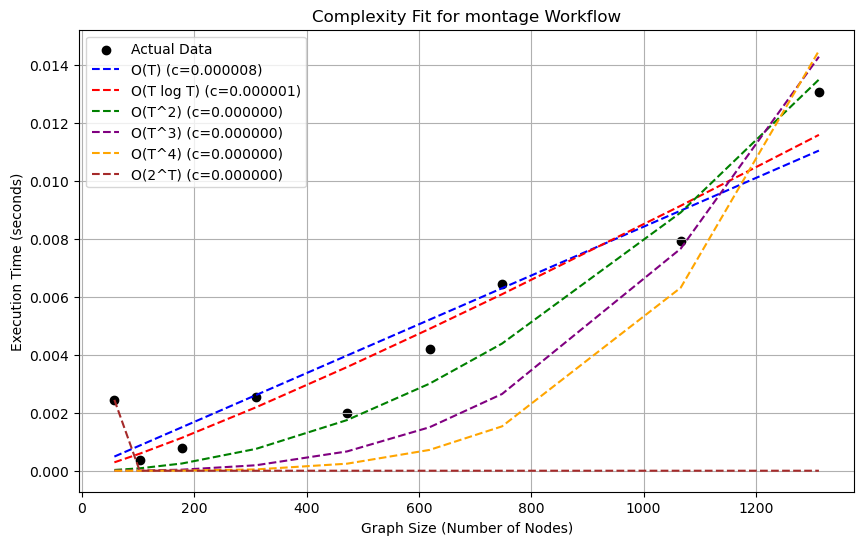

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


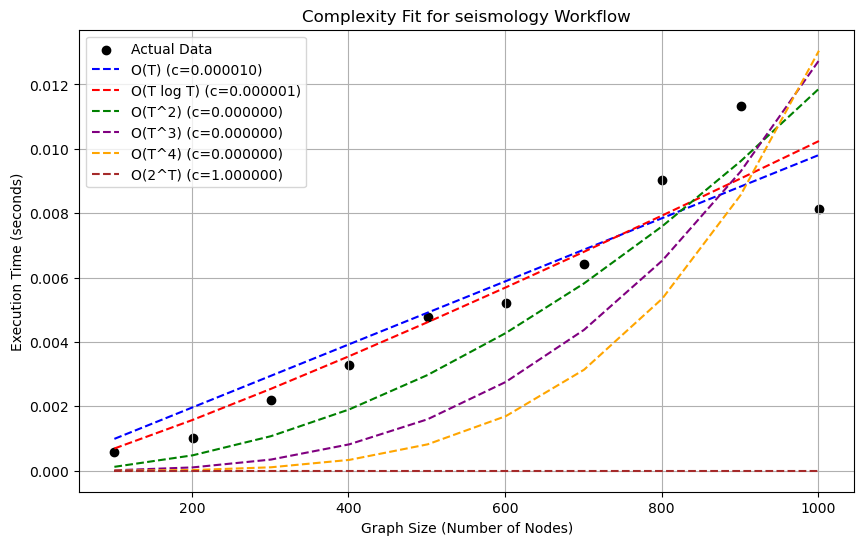

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


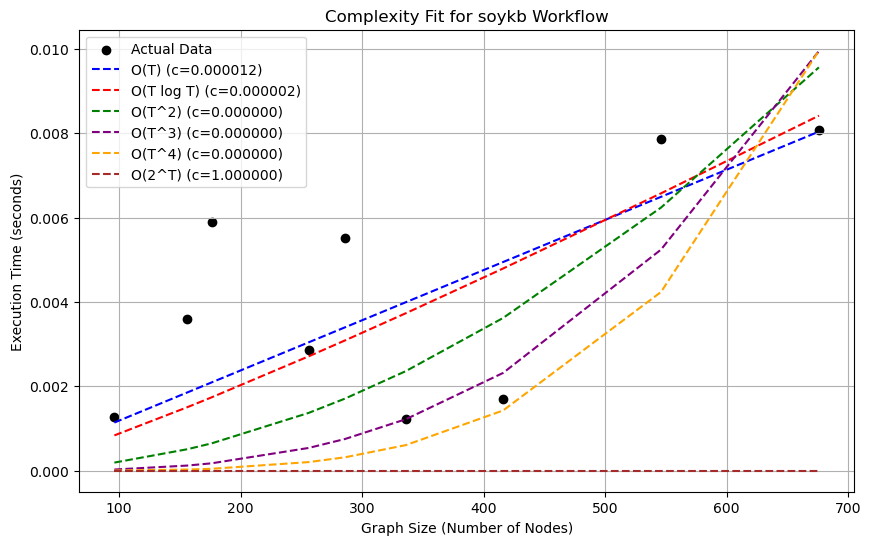

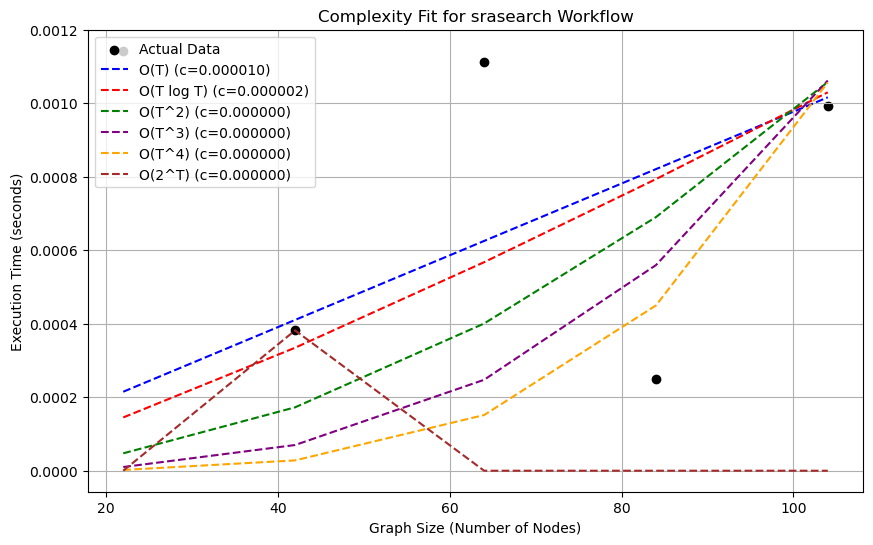

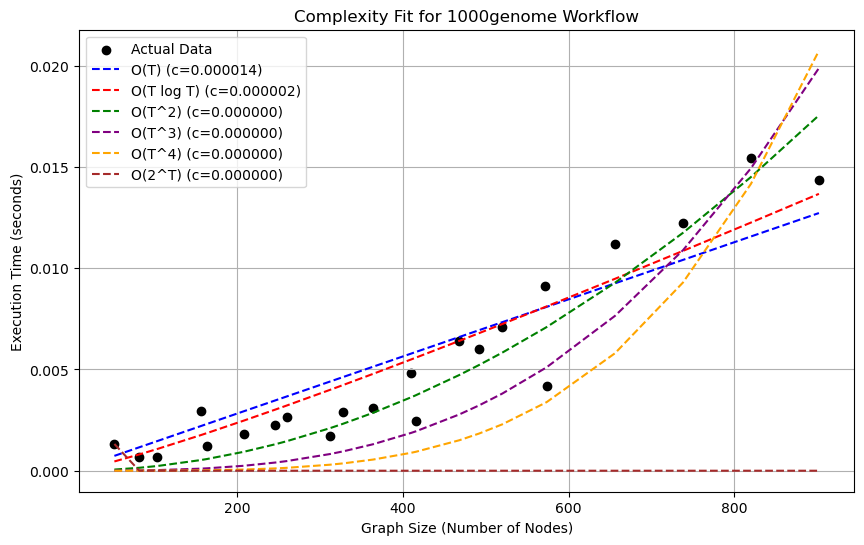

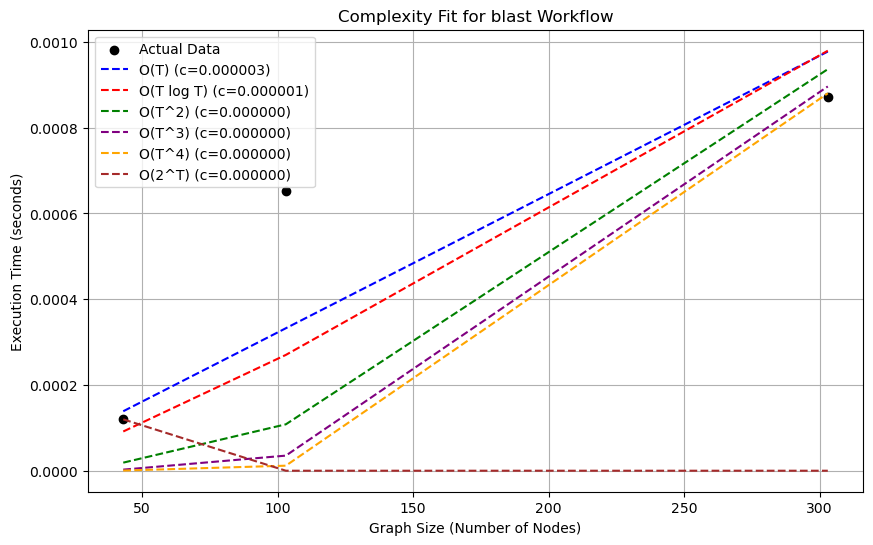

Skipping bwa: Insufficient data for fitting.


/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


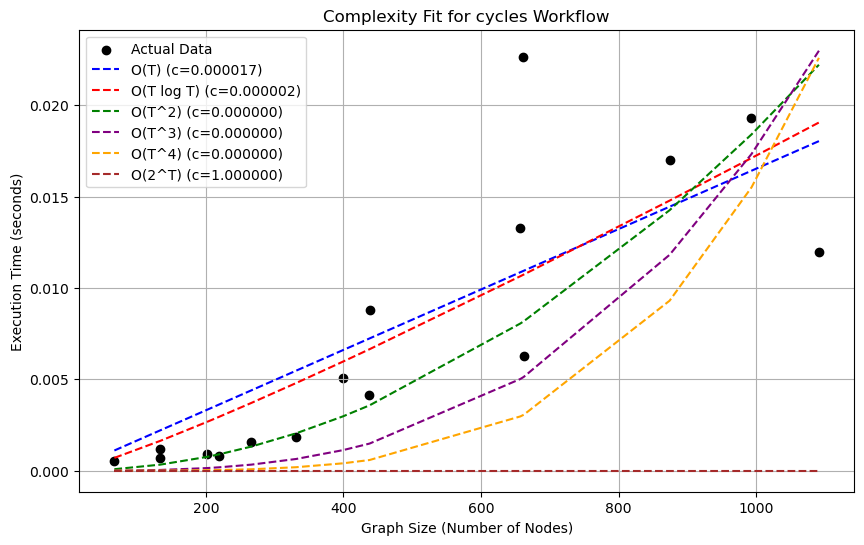

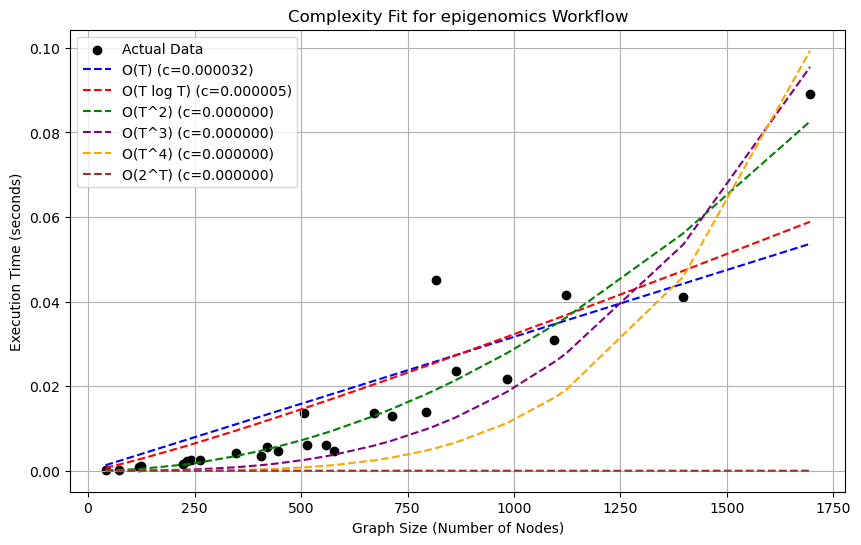

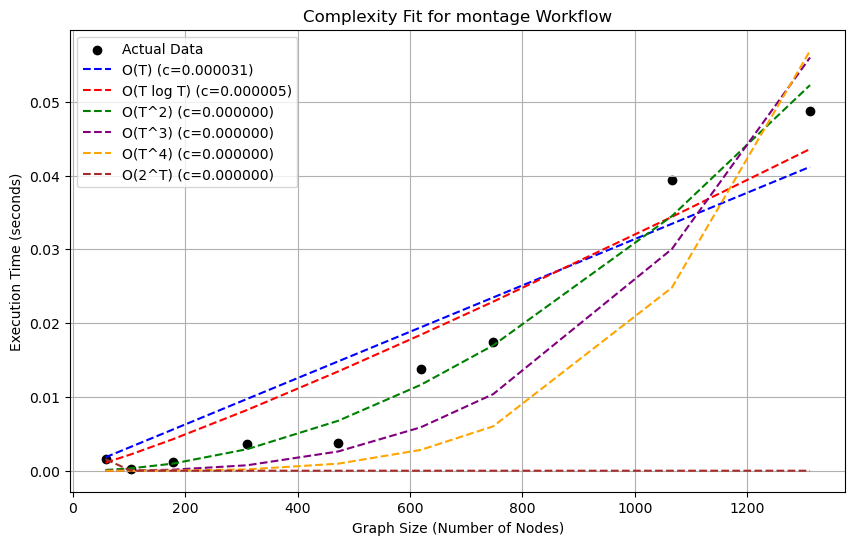

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


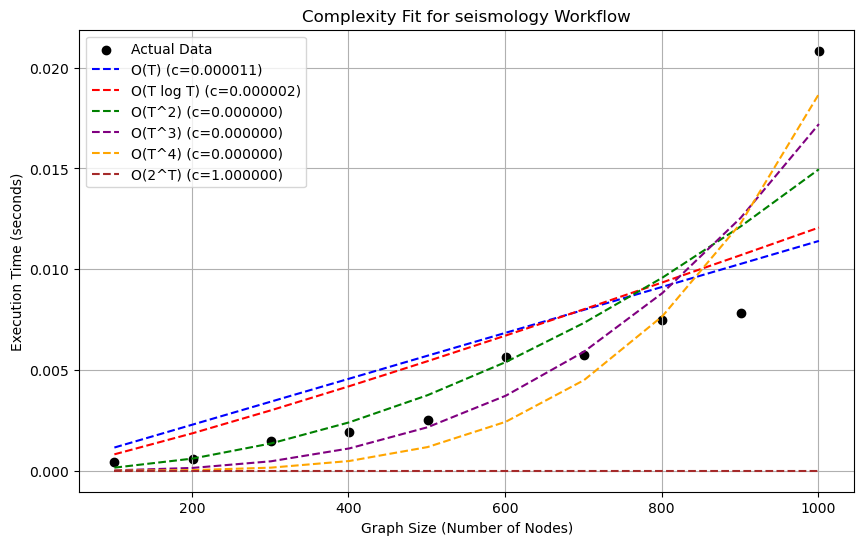

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


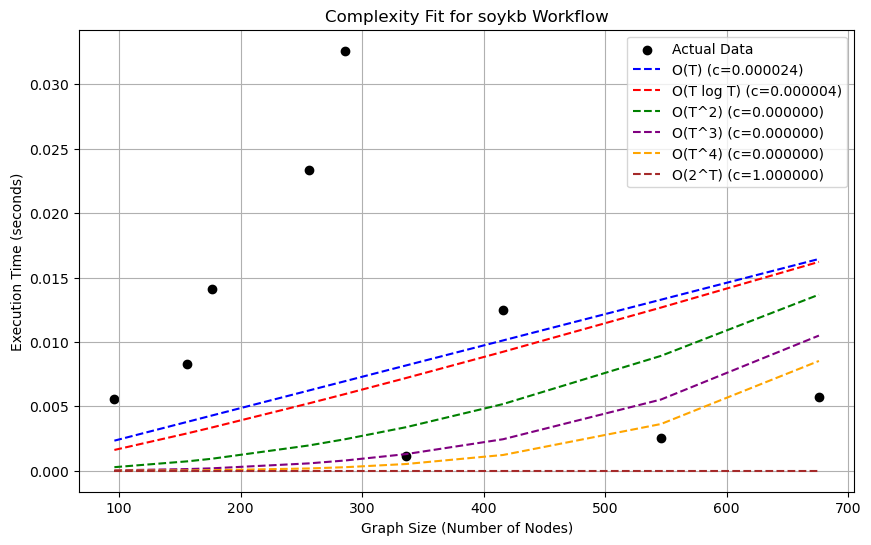

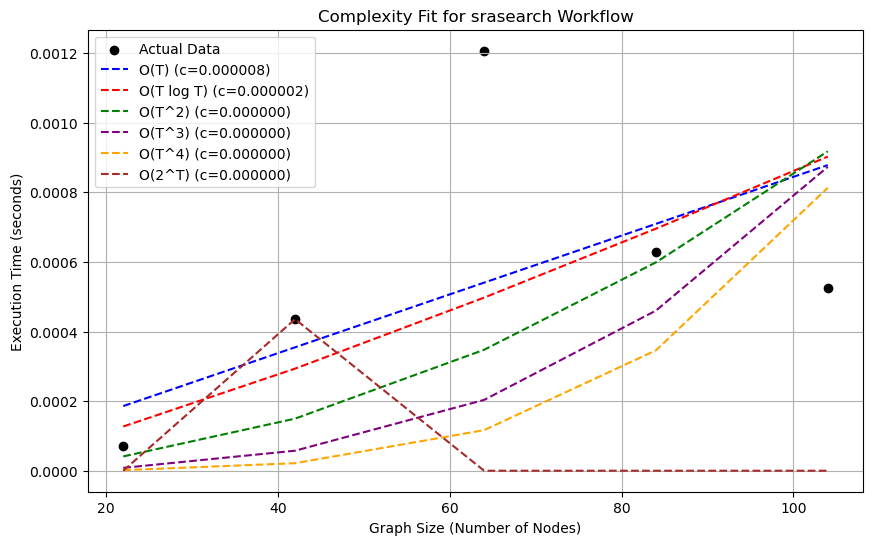

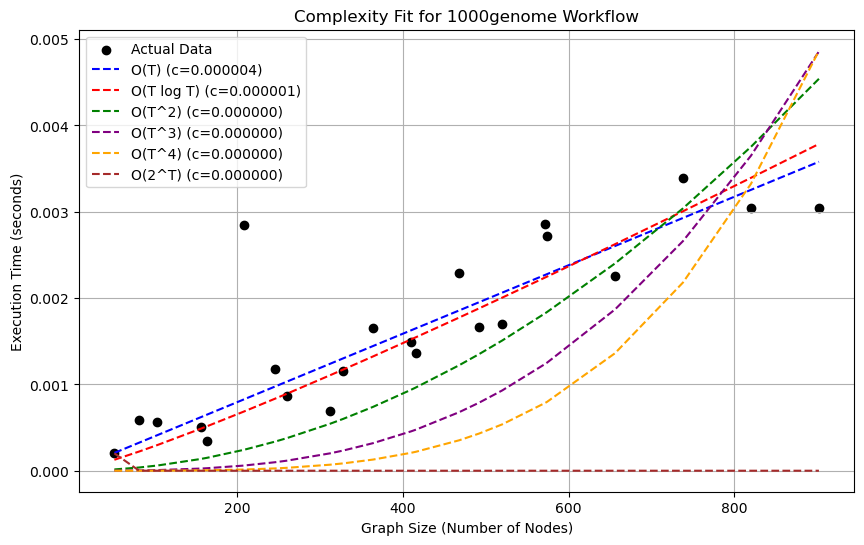

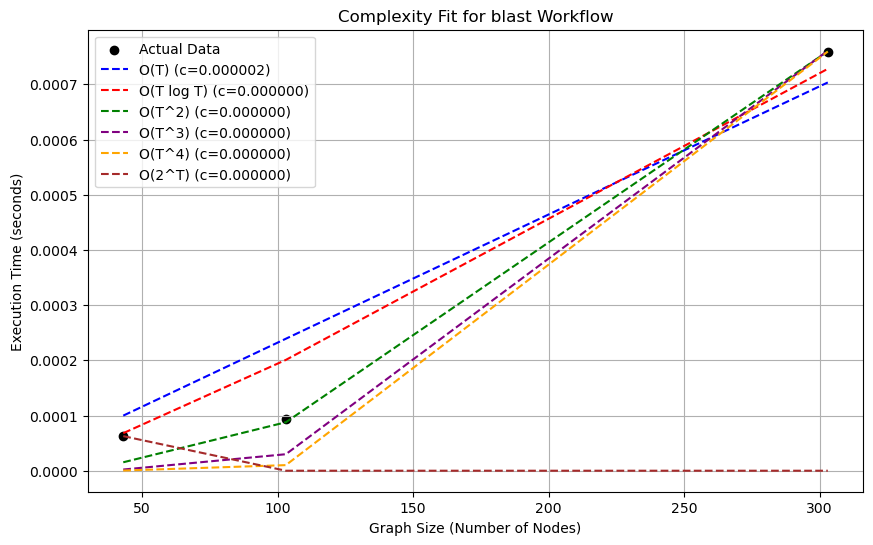

Skipping bwa: Insufficient data for fitting.


/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


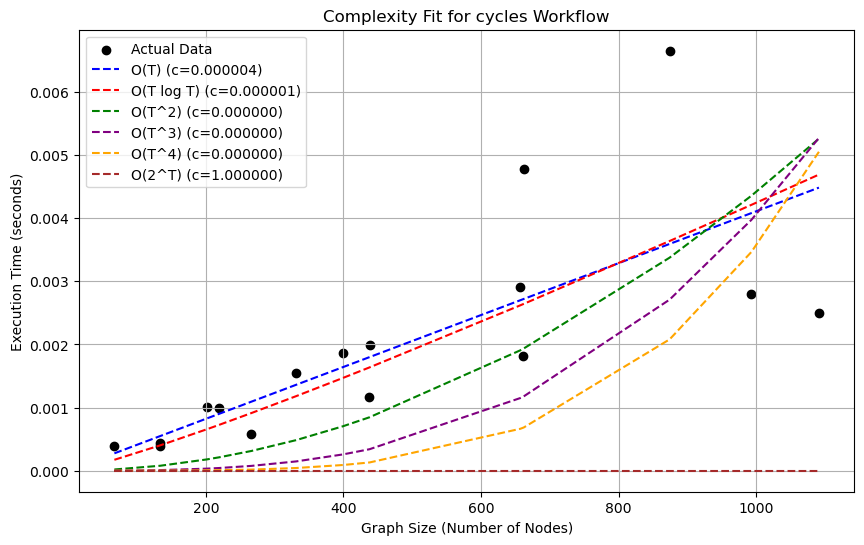

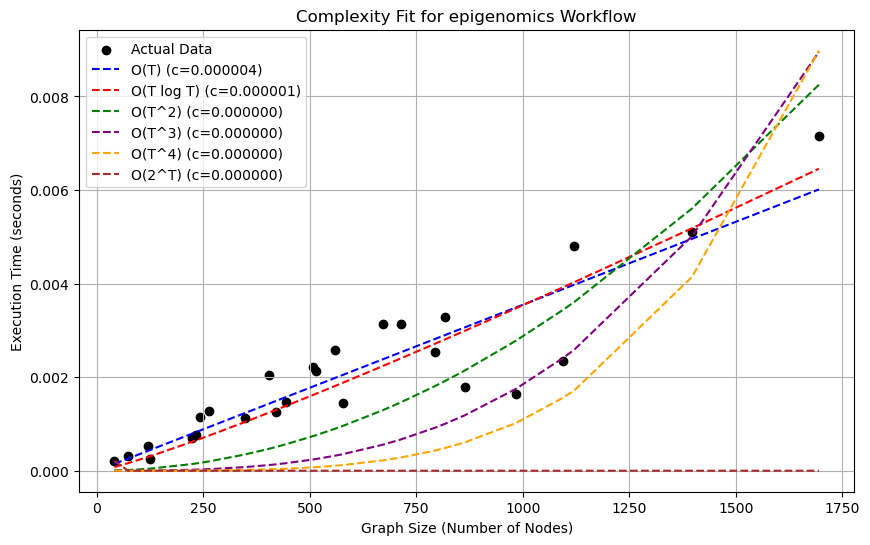

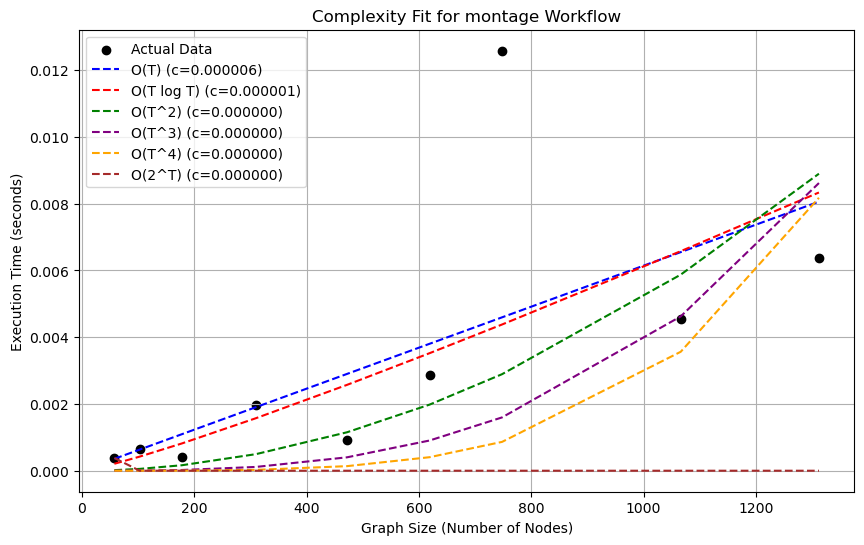

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


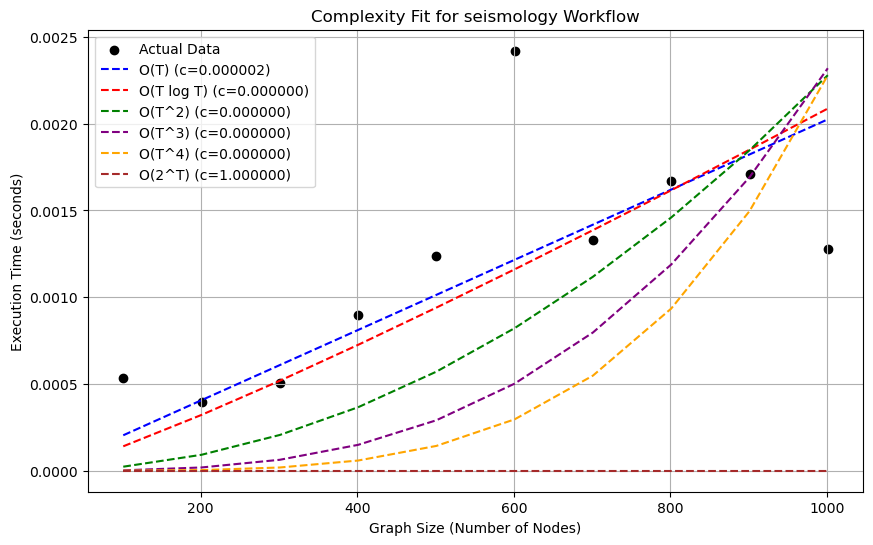

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


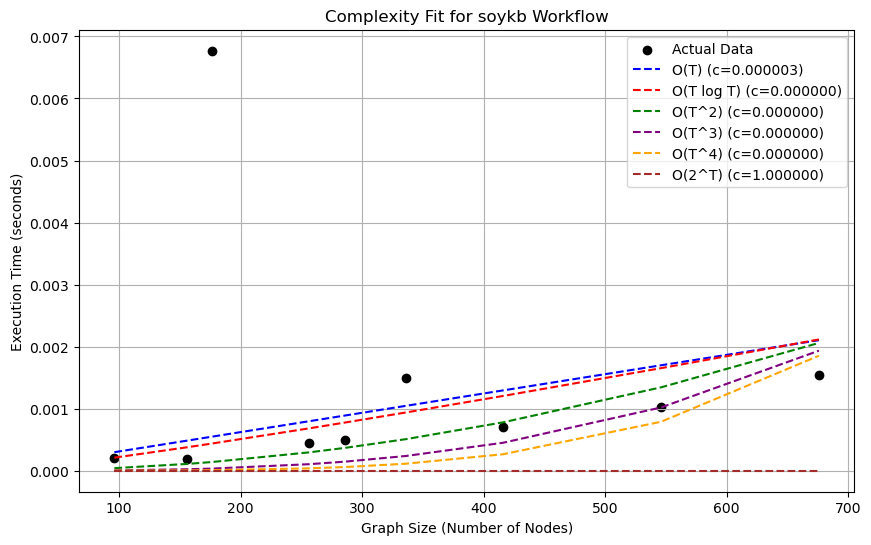

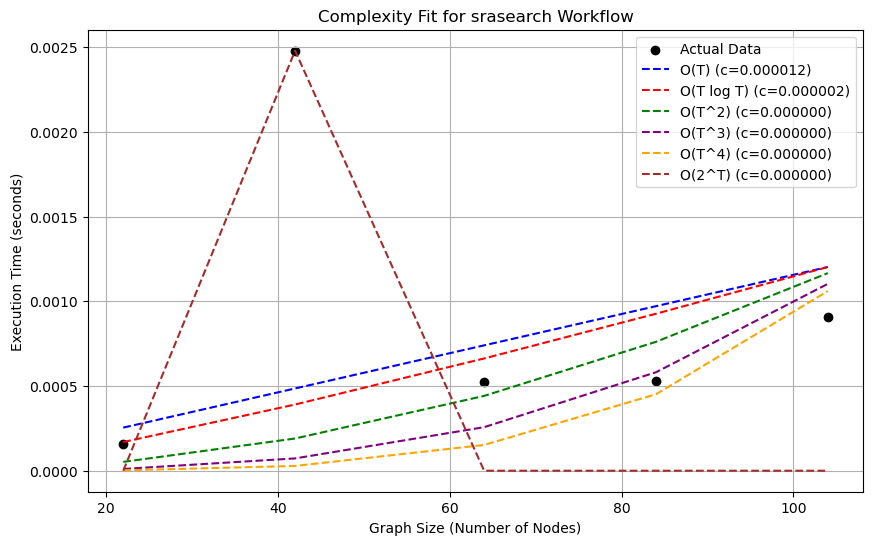

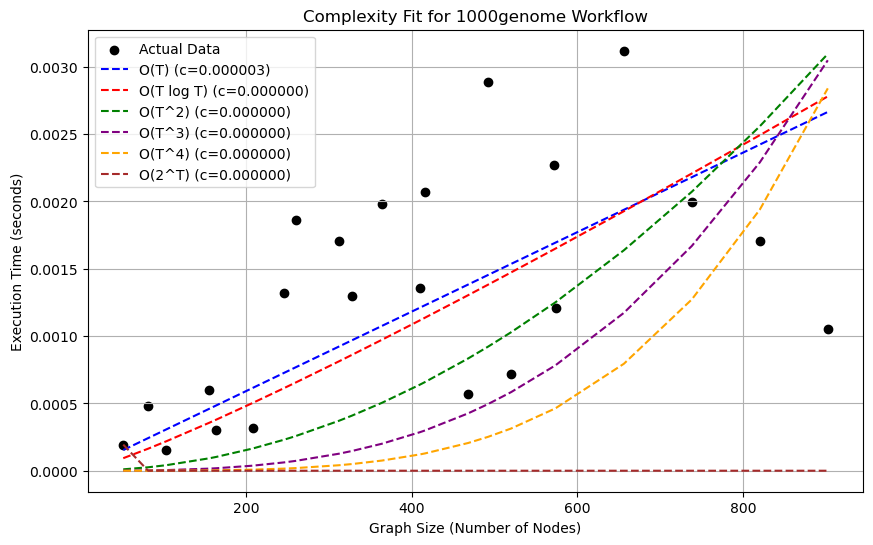

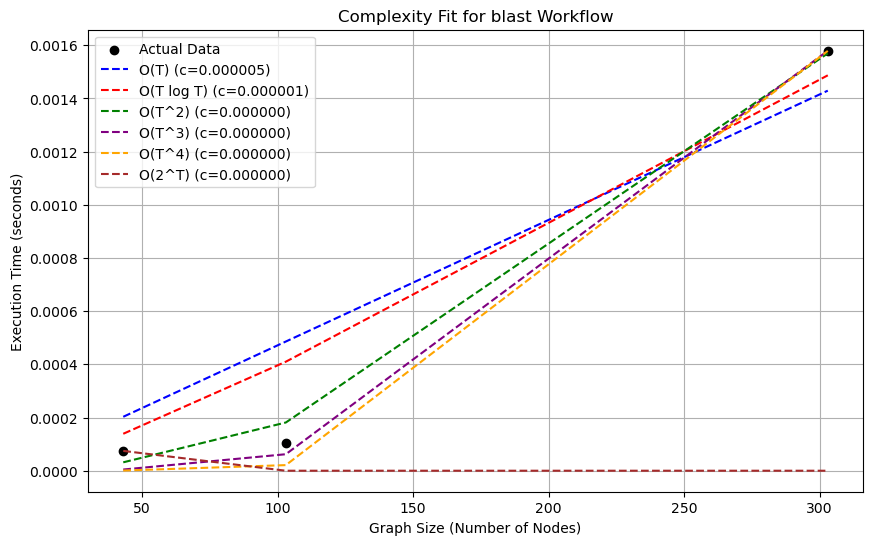

Skipping bwa: Insufficient data for fitting.


/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


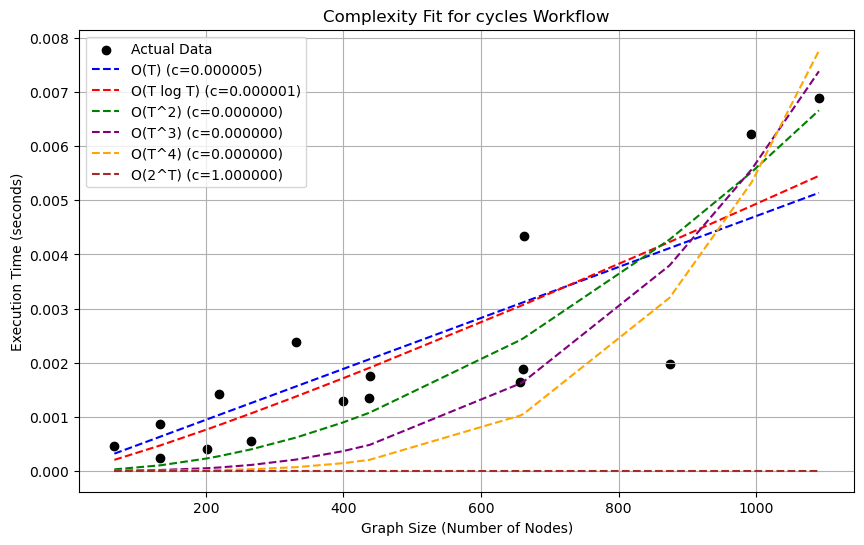

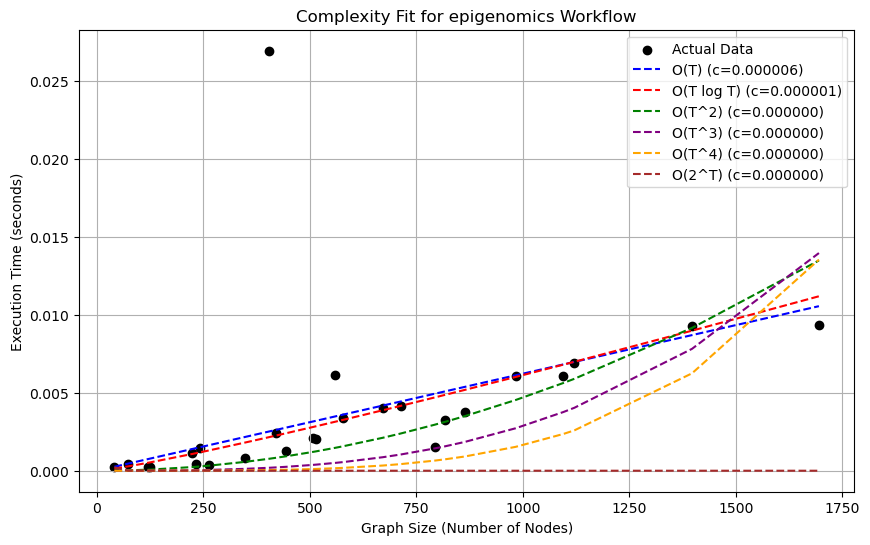

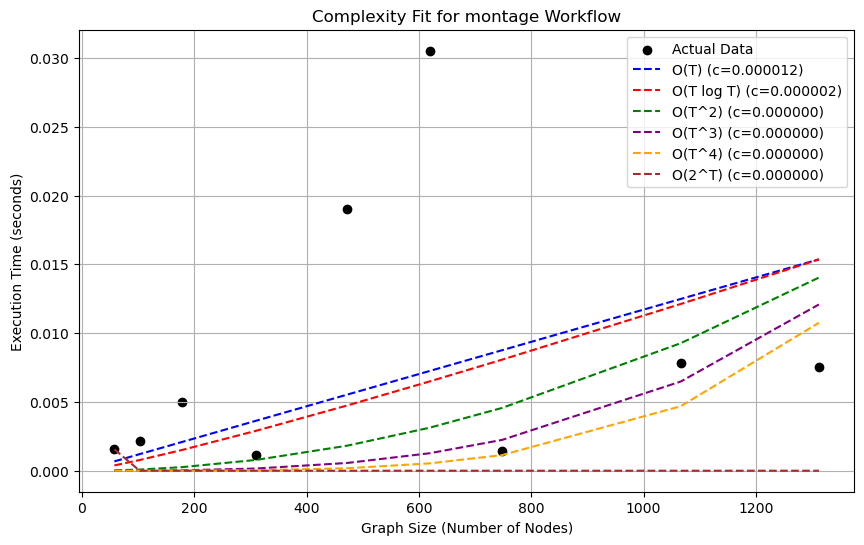

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


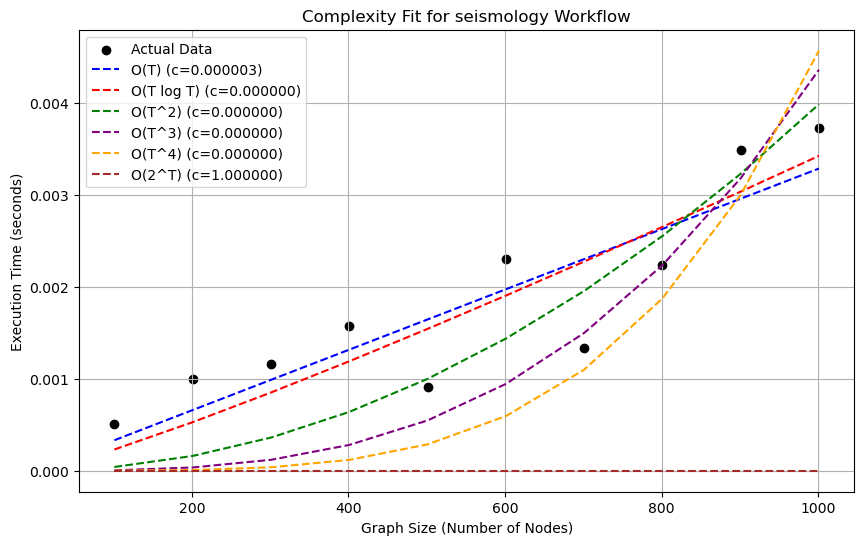

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


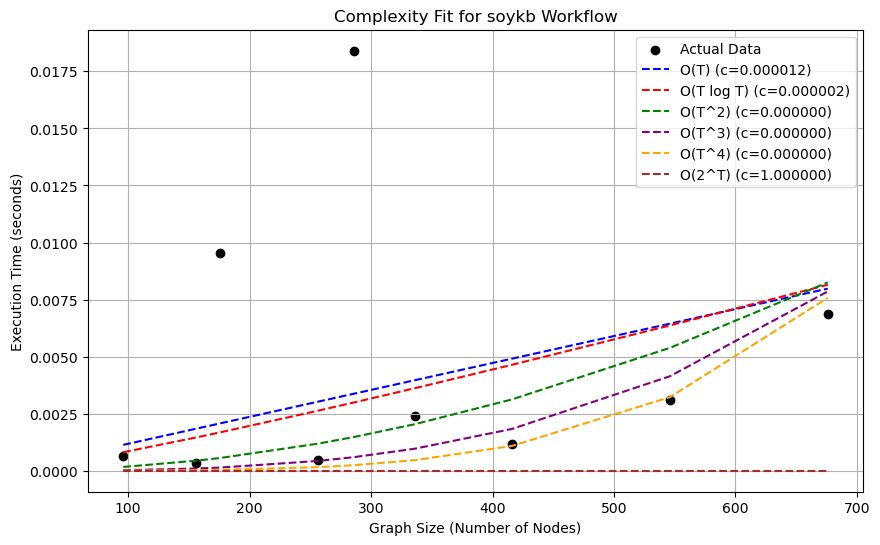

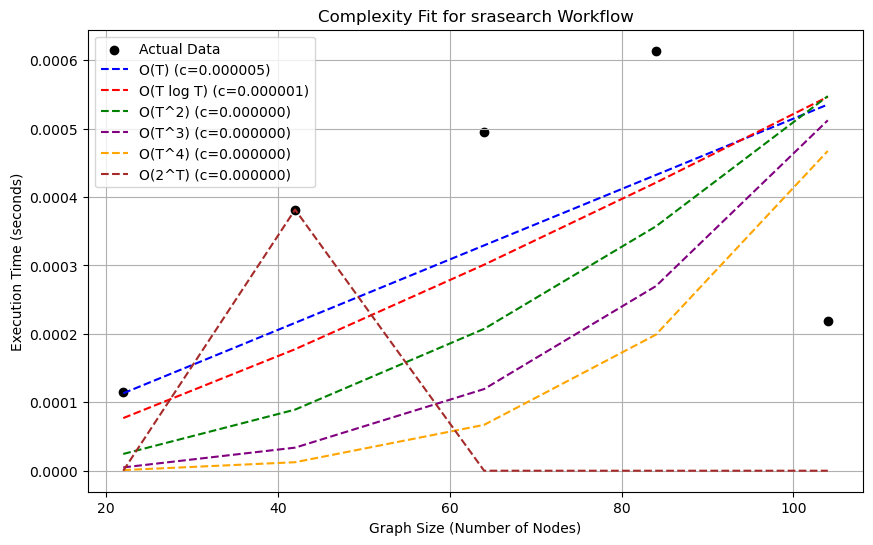

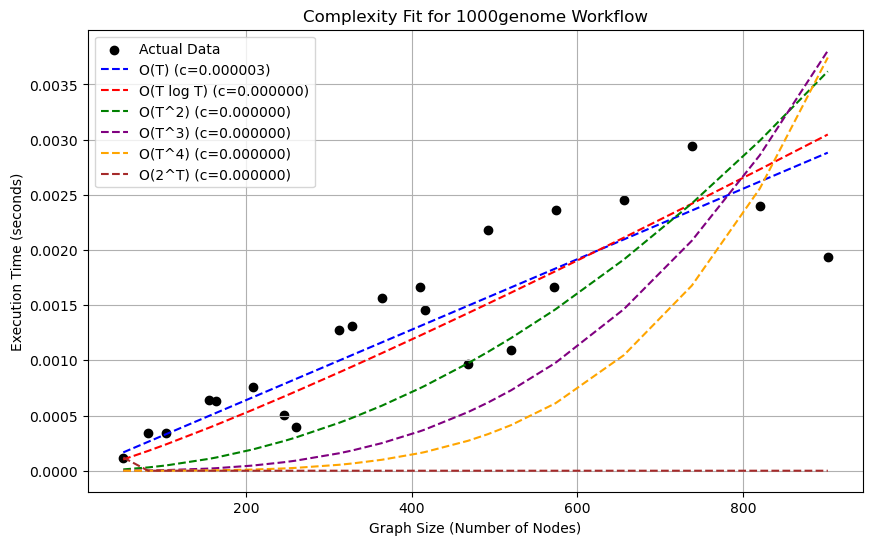

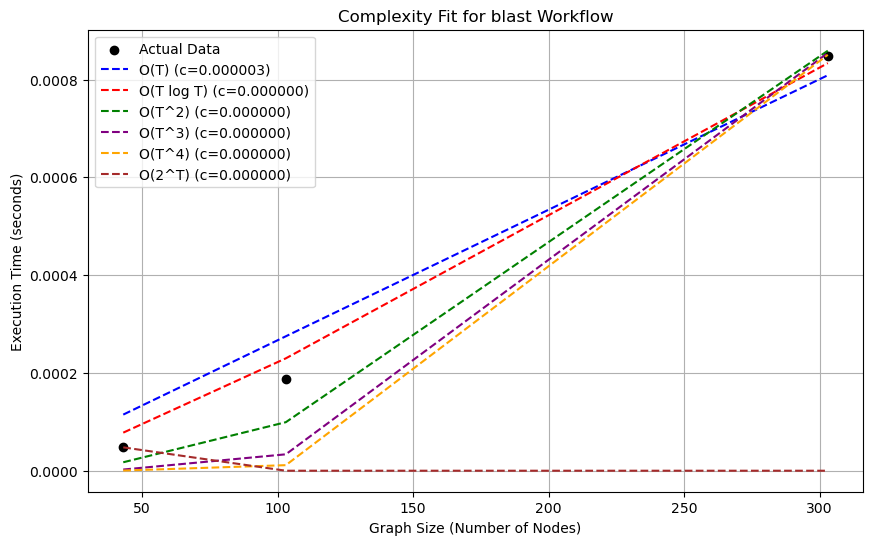

Skipping bwa: Insufficient data for fitting.


/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


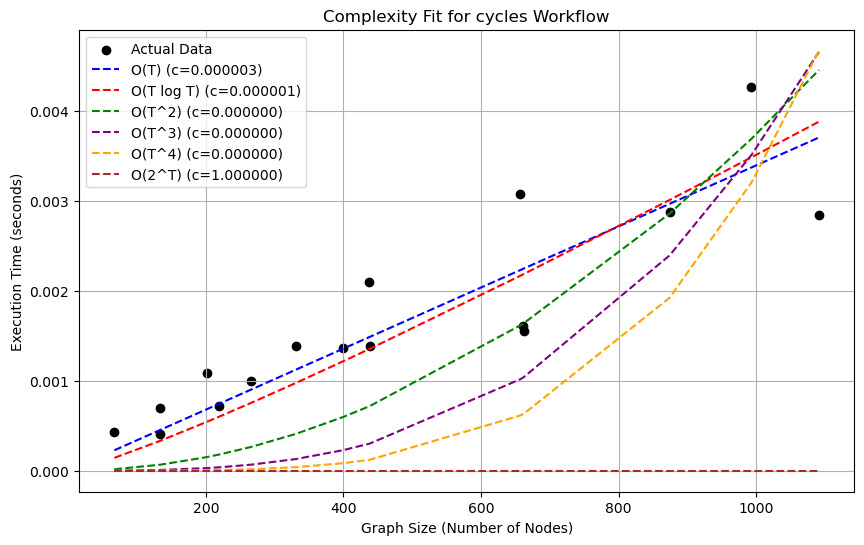

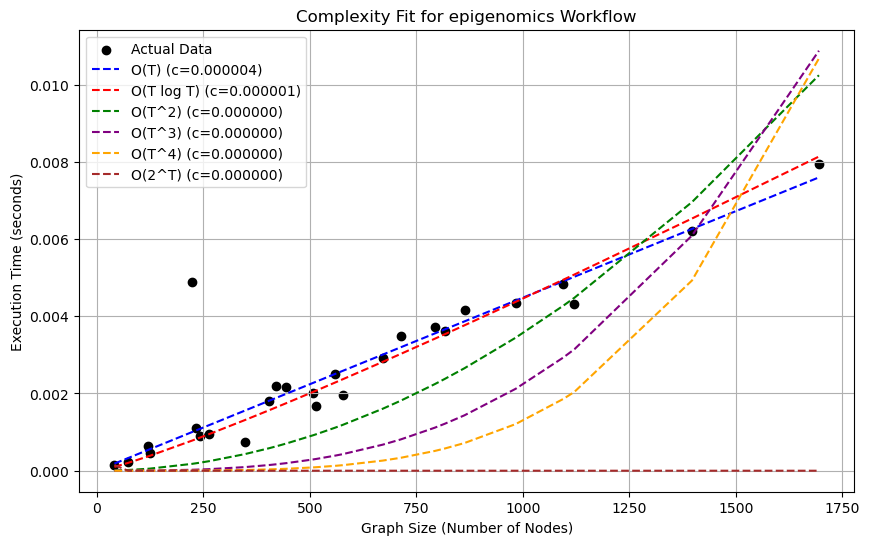

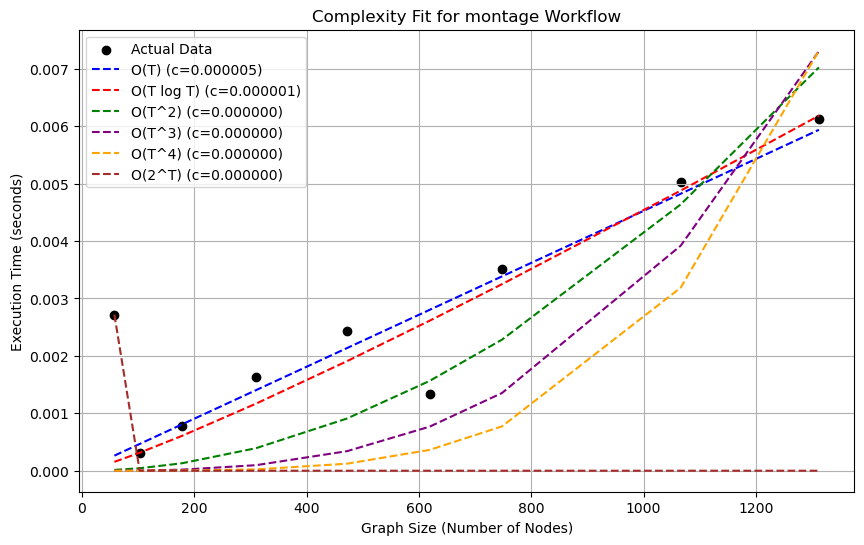

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


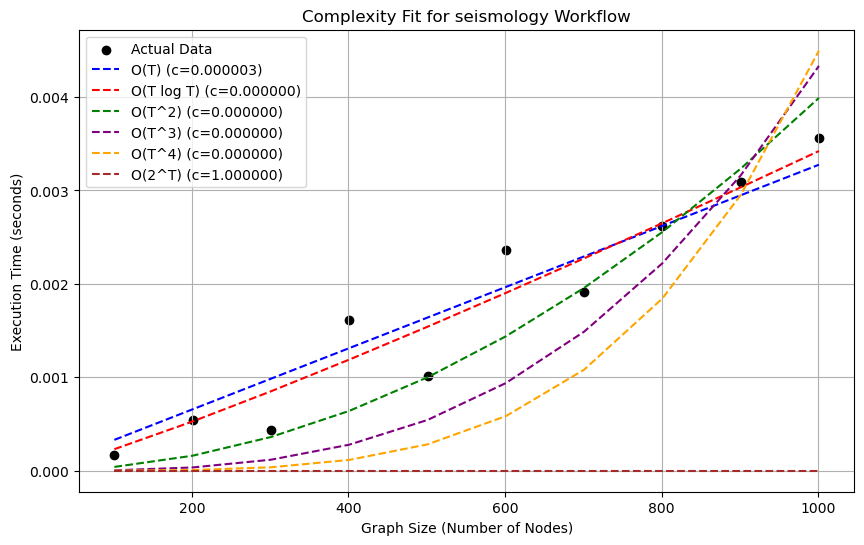

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


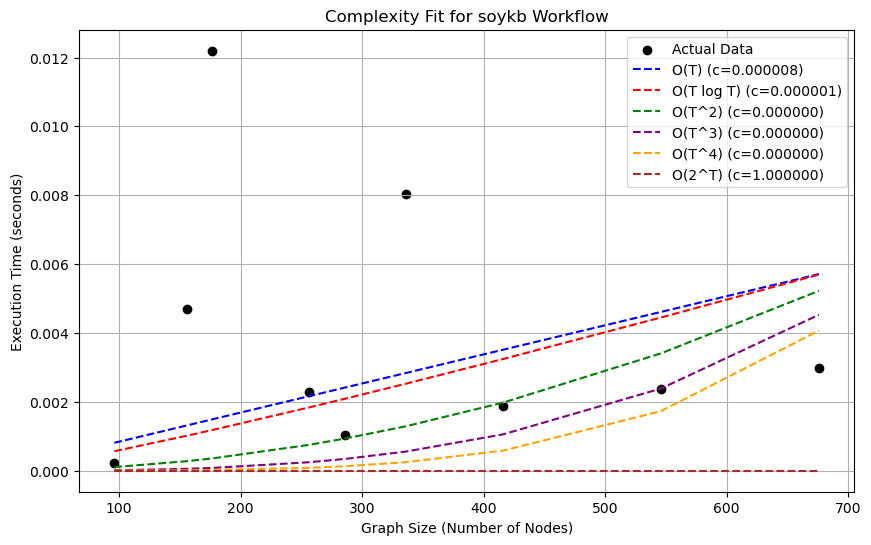

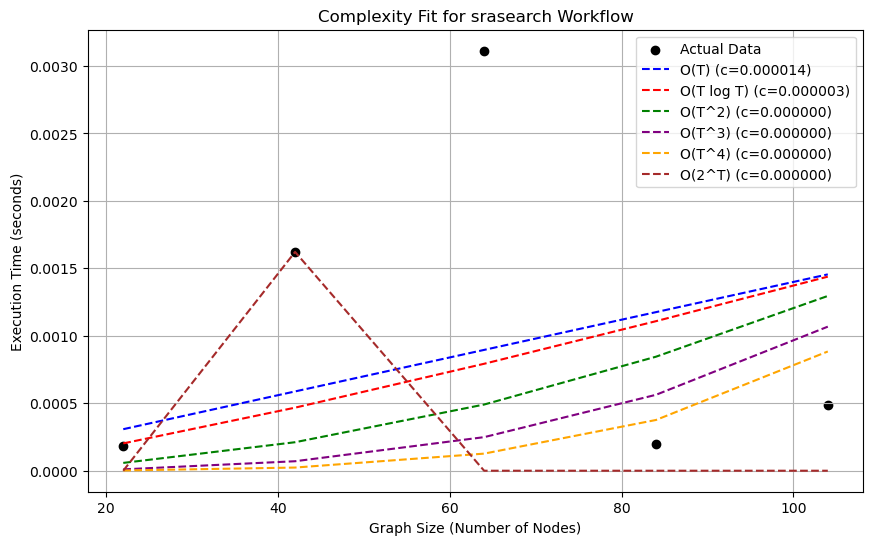

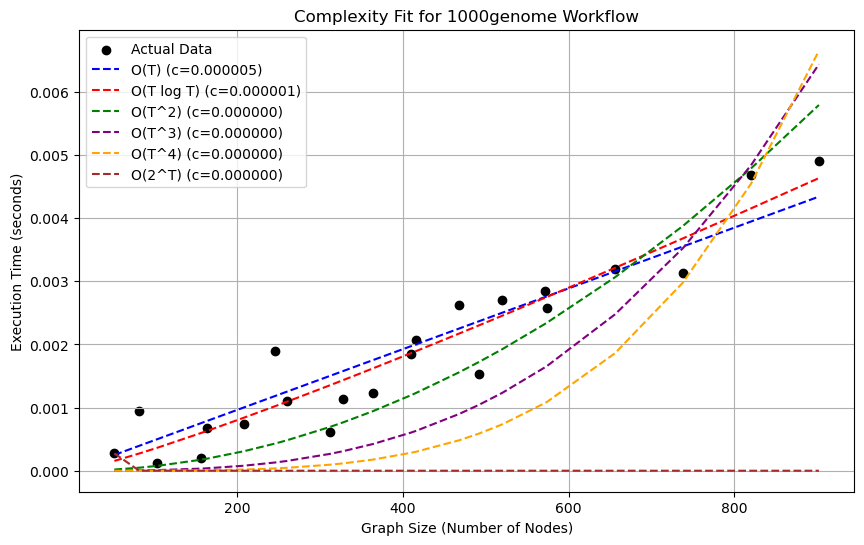

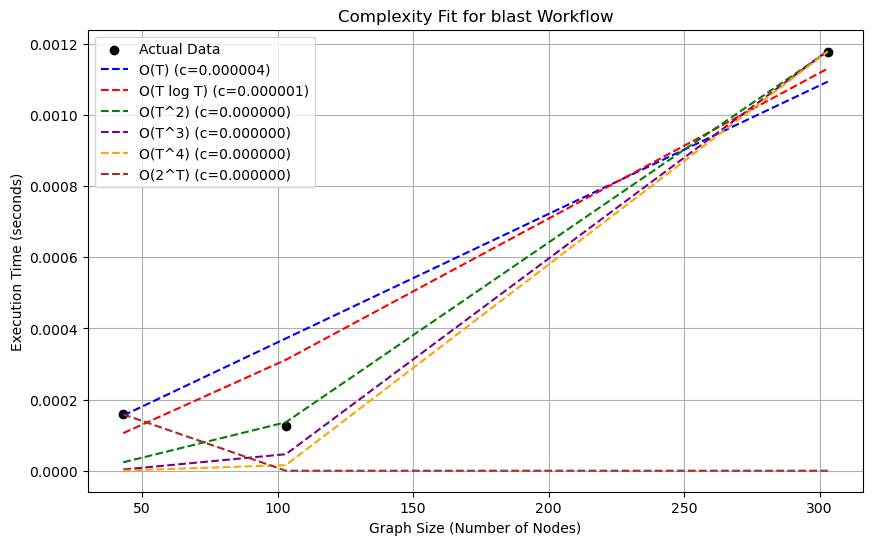

Skipping bwa: Insufficient data for fitting.


/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


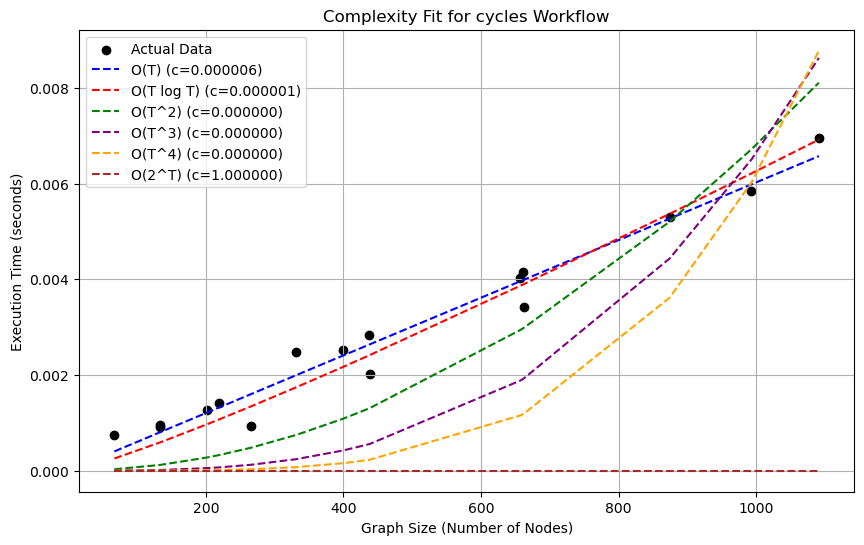

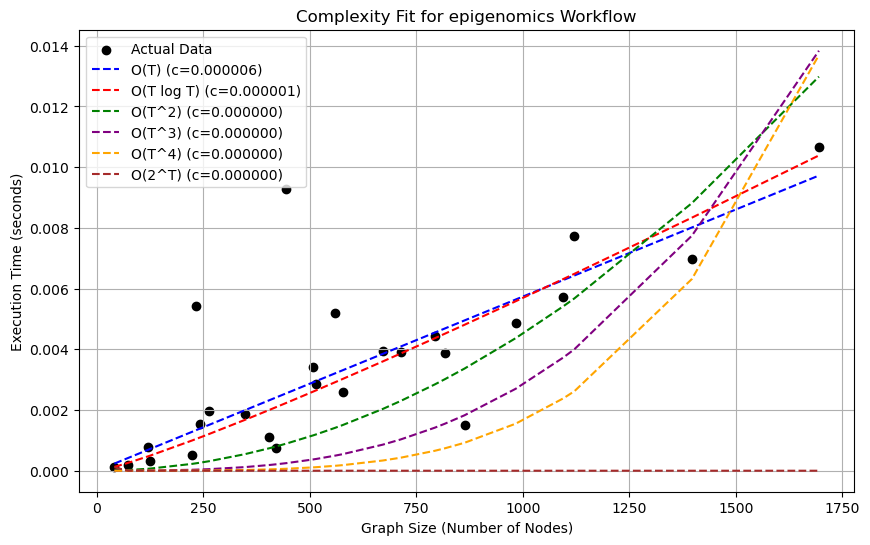

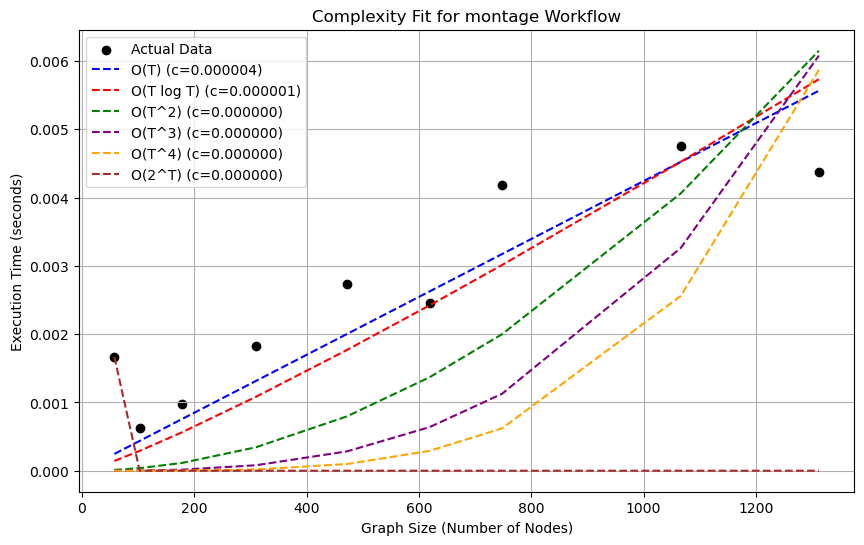

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


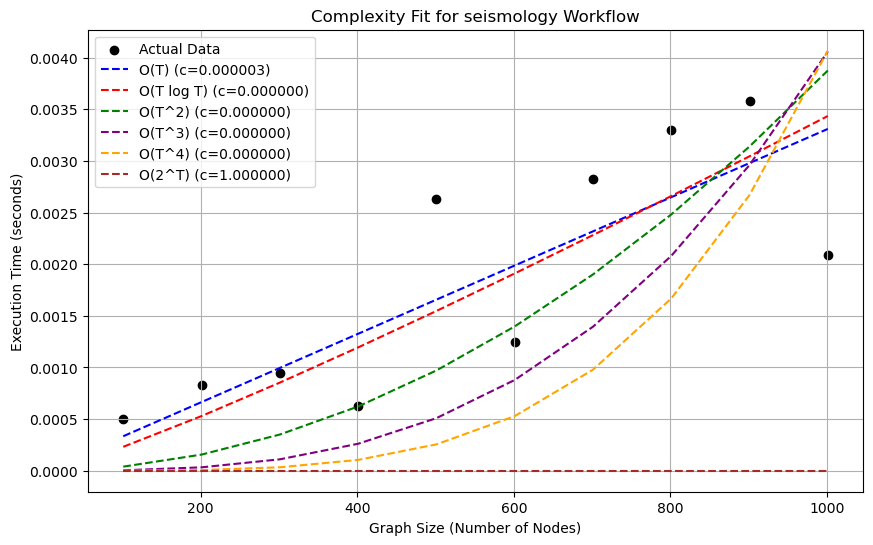

/tmp/ipykernel_7359/1555170969.py:54: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(func, graph_sizes, exec_times, p0=[1], maxfev=5000)


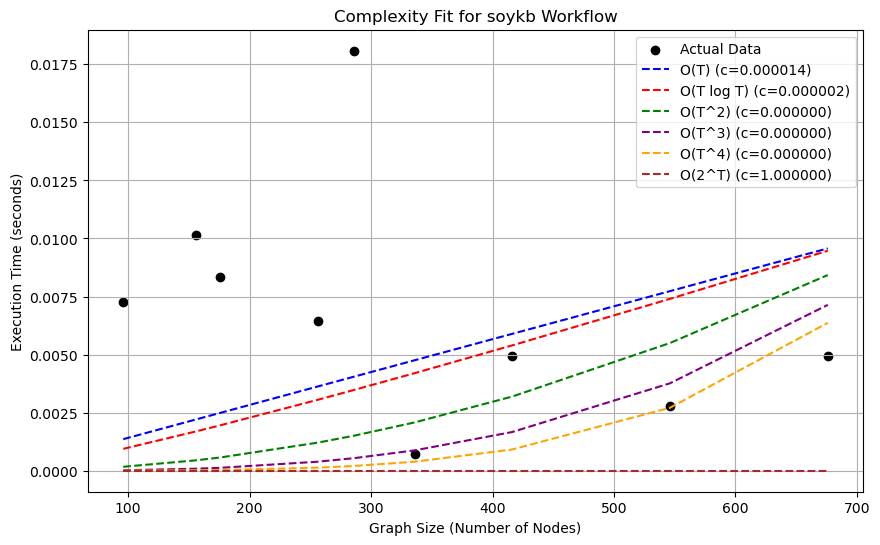

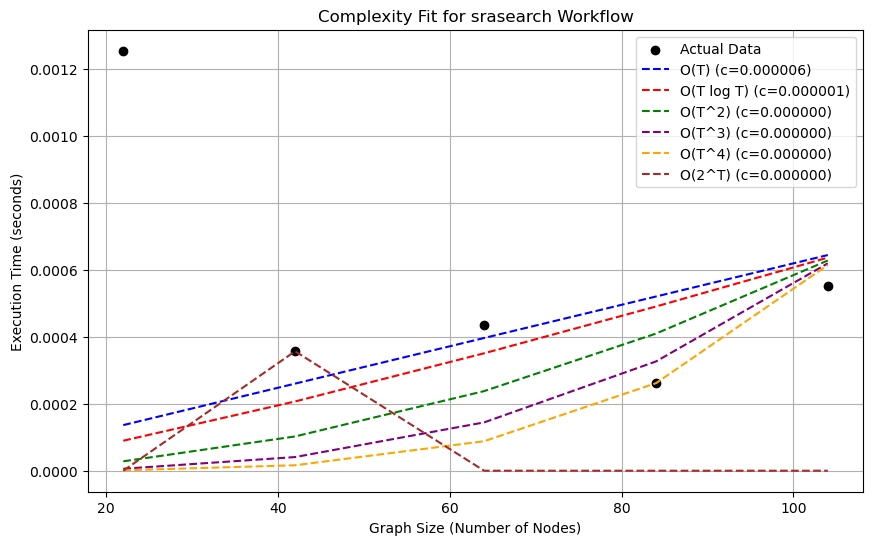

In [16]:

results_df = pd.DataFrame()

for variant in max_df_dytas["scheduler"].unique():
    df_variant = max_df_dytas[max_df_dytas["scheduler"] == variant]
    for workflow in max_df_dytas["workflow"].unique():
        result = fit_and_plot_complexity(df_variant, workflow)
        if result:
            result["DYTAS_variant"] = variant
            results_df = pd.concat([results_df, pd.DataFrame([result])],ignore_index=True)



In [17]:
results_df

,workflow,best_fit,T,T log T,T^2,T^3,T^4,2^T,DYTAS_variant
0,1000genome,T log T,O(T) (c=0.000006),O(T log T) (c=0.000001),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=0.000000),"DYTAS[navigation=All,sorting=DFS,multicore=Ski..."
1,blast,T^2,O(T) (c=0.000003),O(T log T) (c=0.000001),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=0.000000),"DYTAS[navigation=All,sorting=DFS,multicore=Ski..."
2,cycles,T log T,O(T) (c=0.000006),O(T log T) (c=0.000001),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=1.000000),"DYTAS[navigation=All,sorting=DFS,multicore=Ski..."
3,epigenomics,T^2,O(T) (c=0.000013),O(T log T) (c=0.000002),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=0.000000),"DYTAS[navigation=All,sorting=DFS,multicore=Ski..."
4,montage,T^2,O(T) (c=0.000010),O(T log T) (c=0.000001),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=0.000000),"DYTAS[navigation=All,sorting=DFS,multicore=Ski..."
...,...,...,...,...,...,...,...,...,...
59,epigenomics,T,O(T) (c=0.000006),O(T log T) (c=0.000001),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=0.000000),"DYTAS[navigation=Front,sorting=Khan,multicore=..."
60,montage,T,O(T) (c=0.000004),O(T log T) (c=0.000001),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=0.000000),"DYTAS[navigation=Front,sorting=Khan,multicore=..."
61,seismology,T,O(T) (c=0.000003),O(T log T) (c=0.000000),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=1.000000),"DYTAS[navigation=Front,sorting=Khan,multicore=..."
62,soykb,T,O(T) (c=0.000014),O(T log T) (c=0.000002),O(T^2) (c=0.000000),O(T^3) (c=0.000000),O(T^4) (c=0.000000),O(2^T) (c=1.000000),"DYTAS[navigation=Front,sorting=Khan,multicore=..."


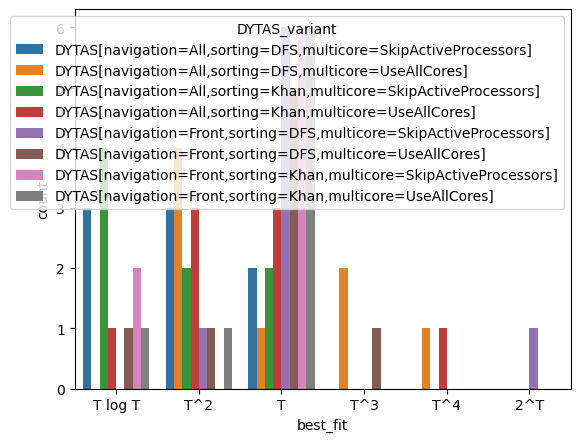

In [18]:
sns.countplot(x="best_fit", data=results_df, hue="DYTAS_variant")
plt.subplots_adjust(top=0.9)
plt.show()


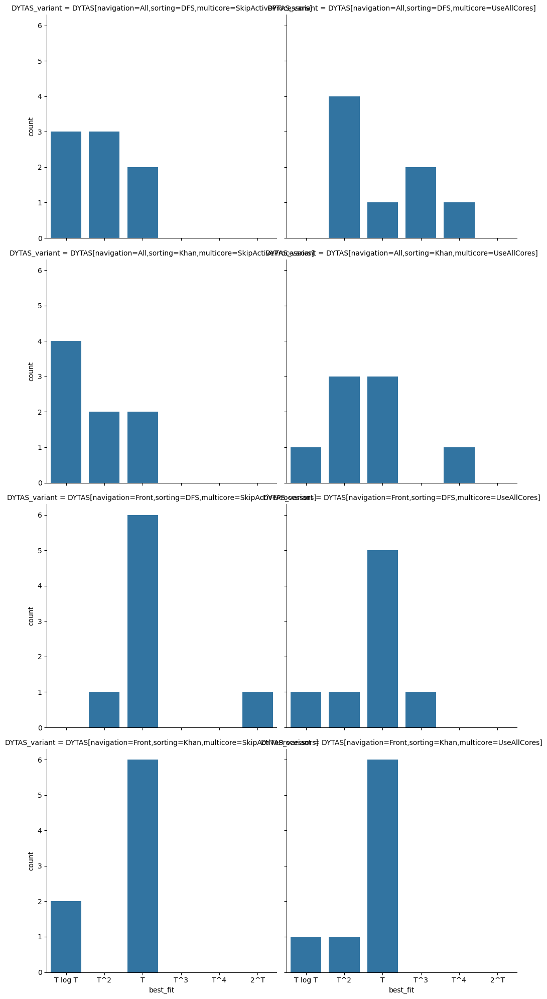

In [19]:
sns.catplot(
    x="best_fit", 
    data=results_df, 
    kind="count", 
    col="DYTAS_variant", 
    col_wrap=2
)